### EA-01. Setup & Data Loading(환경 설정 및 데이터 불러오기)

Error Analysis(오류 분석)를 수행하기 위해 필요한 Library(라이브러리)를 불러오고,
이전 단계에서 생성한 IoU 분석 결과와 Pilot Labeling(파일럿 라벨링) 데이터를 불러온다.

이번 분석에서는 Repeat Labeling(반복 라벨링) 결과와 Reference Labeling(기준 라벨링)을
비교하여 Bounding Box(바운딩 박스)의 불일치 패턴을 확인한다.

#### 분석 목적

- IoU(Intersection over Union)를 기반으로 라벨링 일관성을 평가한다.
- Class(클래스) 및 객체 난이도에 따른 오류 패턴을 확인한다.
- Occlusion(가림), Truncation(잘림), Small/Distant(소형/원거리),
  Ambiguity(모호성)와 라벨링 오류의 관계를 분석한다.
- 반복적으로 발생하는 오류의 Root Cause(근본 원인)를 파악한다.
- 분석 결과를 기반으로 Labeling Guideline(라벨링 가이드라인)의 개선 방향을 도출한다.

In [73]:
# EA-01. Setup

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 100)

print("Error Analysis environment ready.")

Error Analysis environment ready.


In [74]:
# EA-01-2. Load IoU analysis data

from pathlib import Path

# 현재 작업 위치 확인
current_dir = Path.cwd()

print("Current directory:")
print(current_dir)

Current directory:
c:\Users\user\OneDrive\Documents\data-labeling-portfolio\03_autonomous_driving\notebooks


#### EA-01-3. Processed Data(처리 데이터) 확인

Error Analysis(오류 분석)에 사용할 데이터의 저장 위치와 파일명을 확인한다.

이 단계에서는 이전 IoU Analysis(IoU 분석)에서 생성된 결과 파일과
Pilot Labeling(파일럿 라벨링) 데이터를 확인하여 분석에 필요한
Dataset(데이터셋)을 정확하게 불러오기 위한 경로를 설정한다.

In [75]:
# EA-01-3. Check processed data files

project_dir = current_dir.parent
processed_dir = project_dir / "data" / "processed"

print("Project directory:")
print(project_dir)

print("\nProcessed data directory:")
print(processed_dir)

print("\nAvailable files:")
for file_path in sorted(processed_dir.rglob("*")):
    if file_path.is_file():
        print(file_path.relative_to(processed_dir))

Project directory:
c:\Users\user\OneDrive\Documents\data-labeling-portfolio\03_autonomous_driving

Processed data directory:
c:\Users\user\OneDrive\Documents\data-labeling-portfolio\03_autonomous_driving\data\processed

Available files:
iou_analysis_results.csv


#### EA-01-4. Analysis Data Location(분석 데이터 위치) 확인

프로젝트 내 CSV File(CSV 파일)을 검색하여 Error Analysis(오류 분석)에 사용할
IoU 결과와 Pilot Labeling(파일럿 라벨링) 데이터의 실제 저장 위치를 확인한다.

파일 경로를 직접 가정하지 않고 프로젝트 내부의 데이터 파일을 확인함으로써
잘못된 Dataset(데이터셋)을 불러오는 문제를 방지한다.

In [76]:
# EA-01-4. Search CSV files in the project

csv_files = sorted(project_dir.rglob("*.csv"))

print(f"Total CSV files found: {len(csv_files)}")

for file_path in csv_files:
    print(file_path.relative_to(project_dir))

Total CSV files found: 5
annotations\pilot\manual_annotations_73.csv
data\pilot\image_mapping.csv
data\pilot\visual_qa_results.csv
data\pilot\visual_qa_summary.csv
data\processed\iou_analysis_results.csv


#### EA-01-5. Source Data(원천 데이터) 준비

프로젝트 내 데이터 파일을 확인한 결과, Pilot Labeling(파일럿 라벨링)의
Reference Annotation(기준 라벨링)은 `manual_annotations_73.csv`에 저장되어 있다.

이전 IoU Analysis(IoU 분석)에서 생성한 최종 결과는 분석의
Reproducibility(재현성)를 확보하기 위해 별도의 CSV File(CSV 파일)인
`iou_analysis_results.csv`로 저장하였다.

따라서 Error Analysis(오류 분석)에서는 다음 두 Dataset(데이터셋)을 사용한다.

- `manual_annotations_73.csv`: 73개 Reference Annotation(기준 라벨링)
- `iou_analysis_results.csv`: 16개 Repeat Labeling(반복 라벨링)의 IoU 분석 결과

#### EA-01-6. Analysis Data Loading(분석 데이터 불러오기)

Error Analysis(오류 분석)에 사용할 Reference Annotation(기준 라벨링)과
IoU Analysis Result(IoU 분석 결과)를 불러온다.

Reference Annotation(기준 라벨링)은 객체의 Class(클래스)와 Attribute(속성)
정보를 포함하며, IoU Analysis Result(IoU 분석 결과)는 동일 객체에 대한
Reference Bounding Box(기준 바운딩 박스)와 Repeat Bounding Box(반복 바운딩 박스)의
좌표 및 IoU 값을 포함한다.

두 Dataset(데이터셋)을 활용하여 객체 특성과 Bounding Box Error(바운딩 박스 오류)의
관계를 분석한다.

In [77]:
# EA-01-6. Load analysis data

reference_path = project_dir / "annotations" / "pilot" / "manual_annotations_73.csv"
iou_path = project_dir / "data" / "processed" / "iou_analysis_results.csv"

reference_df = pd.read_csv(reference_path)
iou_df = pd.read_csv(iou_path)

print("=== Analysis Data Loaded ===")
print(f"Reference Annotation: {reference_df.shape}")
print(f"IoU Analysis Results: {iou_df.shape}")

=== Analysis Data Loaded ===
Reference Annotation: (73, 12)
IoU Analysis Results: (16, 13)


#### EA-01-7. Data Validation(데이터 검증)

Error Analysis(오류 분석)를 수행하기 전에 불러온 Dataset(데이터셋)의
구조와 품질을 확인한다.

Reference Annotation(기준 라벨링)과 IoU Analysis Result(IoU 분석 결과)의
객체 수, 이미지 수, 중복 여부 및 Missing Value(결측치)를 확인하고,
IoU 값이 정상적인 범위 내에 있는지 검증한다.

이를 통해 이후 분석에서 데이터 구조나 품질 문제로 인해 발생할 수 있는
오류를 사전에 확인한다.

In [78]:
# EA-01-7. Validate analysis data

print("=== Reference Annotation ===")
print(f"Rows: {len(reference_df)}")
print(f"Unique Images: {reference_df['image_name'].nunique()}")
print(f"Unique Objects: {reference_df['object_id'].nunique()}")

print("\n=== IoU Analysis Results ===")
print(f"Rows: {len(iou_df)}")
print(f"Unique Images: {iou_df['image_name'].nunique()}")
print(f"Unique Reference Objects: {iou_df['reference_object_id'].nunique()}")

print("\n=== Duplicate Check ===")
print(
    "Reference Duplicate Objects:",
    reference_df.duplicated(subset=["image_name", "object_id"]).sum()
)
print(
    "IoU Duplicate Objects:",
    iou_df.duplicated(subset=["image_name", "reference_object_id"]).sum()
)

print("\n=== Missing Values in IoU Data ===")
print(iou_df.isna().sum())

print("\n=== IoU Range ===")
print(f"Minimum IoU: {iou_df['iou'].min():.4f}")
print(f"Maximum IoU: {iou_df['iou'].max():.4f}")
print(f"Mean IoU: {iou_df['iou'].mean():.4f}")

print(
    "IoU values outside [0, 1]:",
    ((iou_df["iou"] < 0) | (iou_df["iou"] > 1)).sum()
)

=== Reference Annotation ===
Rows: 73
Unique Images: 8
Unique Objects: 73

=== IoU Analysis Results ===
Rows: 16
Unique Images: 8
Unique Reference Objects: 16

=== Duplicate Check ===
Reference Duplicate Objects: 0
IoU Duplicate Objects: 0

=== Missing Values in IoU Data ===
image_name             0
reference_object_id    0
repeat_class           0
repeat_x_min           0
repeat_y_min           0
repeat_x_max           0
repeat_y_max           0
reference_class        0
ref_x_min              0
ref_y_min              0
ref_x_max              0
ref_y_max              0
iou                    0
dtype: int64

=== IoU Range ===
Minimum IoU: 0.0000
Maximum IoU: 0.9549
Mean IoU: 0.4780
IoU values outside [0, 1]: 0


### EA-02. Error Definition(오류 기준 정의)

Bounding Box(바운딩 박스)의 일관성을 체계적으로 분석하기 위해
IoU(Intersection over Union)를 기준으로 Error Level(오류 수준)을 정의한다.

본 프로젝트에서는 Repeat Labeling(반복 라벨링)과 Reference Labeling(기준 라벨링)의
IoU 값을 이용하여 다음과 같이 세 단계의 Consistency Level(일관성 수준)을 설정한다.

| IoU 범위 | Consistency Level(일관성 수준) | 해석 |
|---|---|---|
| IoU ≥ 0.75 | High Consistency(높은 일관성) | 두 Bounding Box가 높은 수준으로 일치 |
| 0.50 ≤ IoU < 0.75 | Moderate Consistency(보통 일관성) | 일정 수준의 위치 또는 크기 차이 존재 |
| IoU < 0.50 | Low Consistency(낮은 일관성) | Bounding Box 차이가 상대적으로 크게 발생 |

이 기준은 본 Pilot Project(파일럿 프로젝트)의 Error Analysis(오류 분석)를 위한
Project-specific Threshold(프로젝트별 기준)이며, 모든 Object Detection(객체 탐지)
프로젝트에 적용되는 절대적인 품질 기준을 의미하지 않는다.

특히 Low Consistency(낮은 일관성) 객체를 중심으로 Class(클래스),
Occlusion(가림), Truncation(잘림), Small/Distant(소형/원거리),
Ambiguity(모호성) 등의 조건과 오류 발생 패턴을 분석한다.

In [79]:
# EA-02-1. Define IoU consistency levels

def classify_consistency(iou):
    if iou >= 0.75:
        return "High"
    elif iou >= 0.50:
        return "Moderate"
    else:
        return "Low"


iou_df["consistency_level"] = iou_df["iou"].apply(classify_consistency)

print("=== Consistency Level Distribution ===")
print(iou_df["consistency_level"].value_counts())

print("\n=== Consistency Level Distribution (%) ===")
print(
    iou_df["consistency_level"]
    .value_counts(normalize=True)
    .mul(100)
    .round(1)
)

=== Consistency Level Distribution ===
consistency_level
High        7
Low         7
Moderate    2
Name: count, dtype: int64

=== Consistency Level Distribution (%) ===
consistency_level
High        43.8
Low         43.8
Moderate    12.5
Name: proportion, dtype: float64


#### EA-02-2. Consistency Summary(일관성 요약)

총 16개의 Repeat Labeling(반복 라벨링) 객체를 IoU 기준으로 분류한 결과,
High Consistency(높은 일관성)와 Low Consistency(낮은 일관성)가 각각
7개(43.8%)로 동일하게 나타났으며, Moderate Consistency(보통 일관성)는
2개(12.5%)로 확인되었다.

전체 객체의 Mean IoU(평균 IoU)는 0.4780으로 나타났다.

본 결과는 전체 73개 Reference Annotation(기준 라벨링)의 품질을 의미하는 것이 아니라,
Error Analysis(오류 분석)를 위해 선정된 16개 반복 라벨링 표본에서 관찰된 결과이다.

따라서 이후 분석에서는 단순한 오류 비율보다 Low Consistency 객체에서
어떤 Class(클래스)와 Difficulty Factor(난이도 요인)가 반복적으로 나타나는지를
중심으로 분석한다.

In [80]:
# EA-02-3. Check class agreement

iou_df["class_match"] = (
    iou_df["repeat_class"] == iou_df["reference_class"]
)

print("=== Class Agreement ===")
print(iou_df["class_match"].value_counts())

class_agreement_rate = iou_df["class_match"].mean() * 100

print(f"\nClass Agreement Rate: {class_agreement_rate:.1f}%")

print("\n=== Class Mismatch Cases ===")
display(
    iou_df.loc[
        ~iou_df["class_match"],
        [
            "image_name",
            "reference_object_id",
            "reference_class",
            "repeat_class",
            "iou"
        ]
    ]
)

=== Class Agreement ===
class_match
True    16
Name: count, dtype: int64

Class Agreement Rate: 100.0%

=== Class Mismatch Cases ===


,image_name,reference_object_id,reference_class,repeat_class,iou


#### EA-02 Observation(관찰)

- 총 16개 Repeat Labeling(반복 라벨링) 객체의 Class Agreement(클래스 일치도)는 100%로 확인되었다.
- Reference Class(기준 클래스)와 Repeat Class(반복 클래스)가 다른 사례는 발견되지 않았다.
- 따라서 본 표본에서 관찰된 Consistency Difference(일관성 차이)는 Class Selection(클래스 선택)보다 Bounding Box Localization(바운딩 박스 위치 설정)의 차이와 관련되어 있다.
- 특히 Low Consistency(낮은 일관성)로 분류된 7개 객체를 중심으로 객체 특성과 Bounding Box 차이의 관계를 추가 분석할 필요가 있다.

### EA-03. Overall Error Distribution(전체 오류 분포)

Repeat Labeling(반복 라벨링) 16개 객체의 IoU 분포를 분석하여
Bounding Box Consistency(바운딩 박스 일관성)의 전체적인 패턴을 확인한다.

Mean(평균), Median(중앙값), Minimum(최솟값), Maximum(최댓값) 등의
Descriptive Statistics(기술 통계)를 확인하고, IoU 값의 분포를 시각화하여
낮은 일관성을 보이는 객체가 특정 구간에 집중되어 있는지 분석한다.

In [81]:
# EA-03-1. IoU descriptive statistics

iou_stats = iou_df["iou"].describe()

print("=== IoU Descriptive Statistics ===")
print(iou_stats.round(4))

print("\n=== Additional Statistics ===")
print(f"Median IoU: {iou_df['iou'].median():.4f}")
print(f"Standard Deviation: {iou_df['iou'].std():.4f}")

=== IoU Descriptive Statistics ===
count    16.0000
mean      0.4780
std       0.4404
min       0.0000
25%       0.0000
50%       0.7085
75%       0.8963
max       0.9549
Name: iou, dtype: float64

=== Additional Statistics ===
Median IoU: 0.7085
Standard Deviation: 0.4404


#### EA-03-2. IoU Distribution Visualization(분포 시각화)

IoU 값의 분포를 Histogram(히스토그램)으로 시각화하여
Repeat Labeling(반복 라벨링)의 Bounding Box Consistency(바운딩 박스 일관성)가
어떤 구간에 집중되어 있는지 확인한다.

High, Moderate, Low Consistency(높음, 보통, 낮은 일관성)를 구분하는
Project-specific Threshold(프로젝트별 기준)를 함께 표시하여
각 IoU 값의 분포를 비교한다.

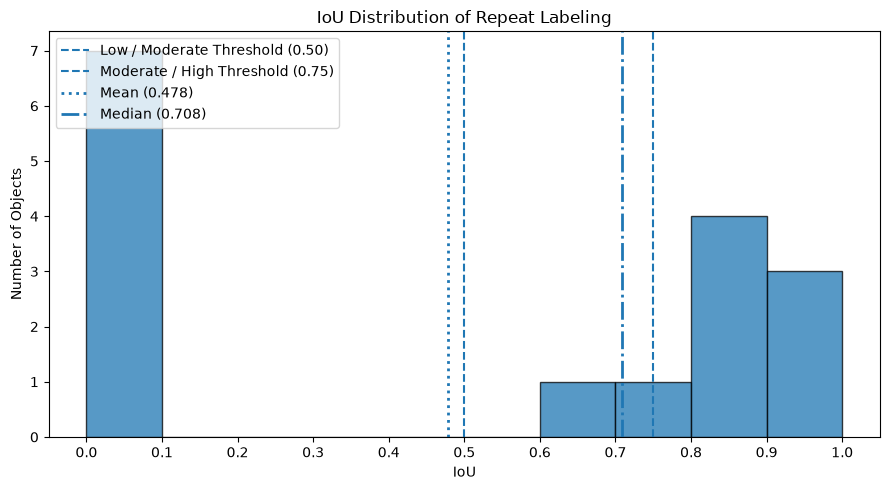

In [82]:
# EA-03-2. Visualize IoU distribution

plt.figure(figsize=(9, 5))

plt.hist(
    iou_df["iou"],
    bins=np.arange(0, 1.1, 0.1),
    edgecolor="black",
    alpha=0.75
)

# Consistency thresholds
plt.axvline(
    0.50,
    linestyle="--",
    linewidth=1.5,
    label="Low / Moderate Threshold (0.50)"
)

plt.axvline(
    0.75,
    linestyle="--",
    linewidth=1.5,
    label="Moderate / High Threshold (0.75)"
)

# Mean and median
plt.axvline(
    iou_df["iou"].mean(),
    linestyle=":",
    linewidth=2,
    label=f"Mean ({iou_df['iou'].mean():.3f})"
)

plt.axvline(
    iou_df["iou"].median(),
    linestyle="-.",
    linewidth=2,
    label=f"Median ({iou_df['iou'].median():.3f})"
)

plt.title("IoU Distribution of Repeat Labeling")
plt.xlabel("IoU")
plt.ylabel("Number of Objects")

plt.xticks(np.arange(0, 1.1, 0.1))
plt.legend()
plt.tight_layout()

plt.show()

#### EA-03-3. Distribution Observation(분포 관찰)

IoU Distribution(분포)을 확인한 결과, 16개 객체의 IoU는 전체 구간에
고르게 분포하지 않고 낮은 값과 높은 값으로 구분되는 패턴을 보였다.

- Mean IoU(평균 IoU)는 0.4780인 반면 Median IoU(중앙값)는 0.7085로 나타났다.
- Low Consistency(낮은 일관성)로 분류된 7개 객체는 IoU 0.1 미만 구간에 집중되어 있다.
- 나머지 객체는 주로 IoU 0.6 이상 구간에 분포하며, High Consistency(높은 일관성)
  객체 7개는 IoU 0.75 이상으로 나타났다.
- 특히 IoU 0.1~0.6 구간에서는 객체가 관찰되지 않아, 단순한 Bounding Box(바운딩 박스)
  위치 차이 외에 특정 오류 패턴이 Low Consistency 객체에 영향을 미쳤을 가능성이 있다.
- Mean(평균)과 Median(중앙값)의 차이는 매우 낮은 IoU 값을 가진 객체들의 영향을
  받은 것으로 판단된다.

따라서 다음 단계에서는 Low Consistency 객체, 특히 IoU가 0에 가까운 객체를
식별하여 공통적인 Error Pattern(오류 패턴)이 존재하는지 확인한다.

In [83]:
# EA-03-4. Identify low-IoU cases

low_iou_cases = (
    iou_df.loc[
        iou_df["iou"] < 0.50,
        [
            "image_name",
            "reference_object_id",
            "reference_class",
            "repeat_class",
            "iou"
        ]
    ]
    .sort_values("iou")
    .reset_index(drop=True)
)

print("=== Low Consistency Cases (IoU < 0.50) ===")
print(f"Number of Cases: {len(low_iou_cases)}")

display(low_iou_cases)

print("\n=== Exact Zero IoU ===")
print(f"Number of IoU = 0 Cases: {(iou_df['iou'] == 0).sum()}")

=== Low Consistency Cases (IoU < 0.50) ===
Number of Cases: 7


,image_name,reference_object_id,reference_class,repeat_class,iou
0,image_02.jpg,C02_OBJ_001,Car,Car,0.0
1,image_04.jpg,C04_OBJ_008,Traffic Cone,Traffic Cone,0.0
2,image_05.jpg,C05_OBJ_001,Pedestrian,Pedestrian,0.0
3,image_06.jpg,C06_OBJ_001,Traffic Cone,Traffic Cone,0.0
4,image_06.jpg,C06_OBJ_004,Traffic Cone,Traffic Cone,0.0
5,image_07.jpg,C07_OBJ_003,Car,Car,0.0
6,image_08.jpg,C08_OBJ_005,Traffic Cone,Traffic Cone,0.0



=== Exact Zero IoU ===
Number of IoU = 0 Cases: 7


#### EA-03-5. Zero-IoU Pattern(Zero-IoU 패턴)

Low Consistency(낮은 일관성)로 분류된 7개 객체를 확인한 결과,
모든 객체의 IoU가 정확히 0으로 나타났다.

- Zero-IoU 객체: 7개 / 16개 (43.8%)
- 7개 객체 모두 Reference Class(기준 클래스)와 Repeat Class(반복 클래스)가 일치하였다.
- Zero-IoU 사례는 Car(자동차), Traffic Cone(트래픽 콘), Pedestrian(보행자) 등
  여러 Class(클래스)에서 나타났다.
- 반면 0보다 크고 0.6보다 작은 IoU를 가진 객체는 관찰되지 않았다.

따라서 Zero-IoU 사례는 단순한 Bounding Box Boundary(바운딩 박스 경계)의
미세한 차이보다는 Object Selection(객체 선택), Object Matching(객체 매칭),
또는 Bounding Box Position(바운딩 박스 위치)의 큰 차이와 관련되었을 가능성이 있다.

다음 단계에서는 Reference Bounding Box(기준 바운딩 박스)와
Repeat Bounding Box(반복 바운딩 박스)의 좌표를 직접 비교하여
Zero-IoU 발생 원인을 확인한다.

In [84]:
# EA-03-6. Compare bounding boxes for zero-IoU cases

zero_iou_cases = (
    iou_df.loc[
        iou_df["iou"] == 0,
        [
            "image_name",
            "reference_object_id",
            "reference_class",
            "repeat_x_min",
            "repeat_y_min",
            "repeat_x_max",
            "repeat_y_max",
            "ref_x_min",
            "ref_y_min",
            "ref_x_max",
            "ref_y_max",
            "iou"
        ]
    ]
    .sort_values(["image_name", "reference_object_id"])
    .reset_index(drop=True)
)

display(zero_iou_cases)

,image_name,reference_object_id,reference_class,repeat_x_min,repeat_y_min,repeat_x_max,repeat_y_max,ref_x_min,ref_y_min,ref_x_max,ref_y_max,iou
0,image_02.jpg,C02_OBJ_001,Car,713.68,411.60,747.60,434.21,870.72,414.64,905.05,444.81,0.0
1,image_04.jpg,C04_OBJ_008,Traffic Cone,788.96,491.25,798.14,516.17,736.79,498.72,741.80,515.00,0.0
2,image_05.jpg,C05_OBJ_001,Pedestrian,1110.70,403.76,1163.70,558.27,154.30,422.93,209.50,548.12,0.0
3,image_06.jpg,C06_OBJ_001,Traffic Cone,519.33,522.10,527.40,552.30,463.80,510.00,472.40,536.40,0.0
4,image_06.jpg,C06_OBJ_004,Traffic Cone,532.00,524.90,540.70,557.60,498.80,517.60,509.90,544.70,0.0
5,image_07.jpg,C07_OBJ_003,Car,1124.21,499.62,1162.56,533.46,1342.30,515.50,1418.07,541.70,0.0
6,image_08.jpg,C08_OBJ_005,Traffic Cone,718.91,522.70,724.74,545.16,725.00,526.12,734.40,543.40,0.0


In [85]:
# Calculate bounding box center points and distance

zero_iou_cases = zero_iou_cases.copy()

zero_iou_cases["repeat_center_x"] = (
    zero_iou_cases["repeat_x_min"] + zero_iou_cases["repeat_x_max"]
) / 2

zero_iou_cases["repeat_center_y"] = (
    zero_iou_cases["repeat_y_min"] + zero_iou_cases["repeat_y_max"]
) / 2

zero_iou_cases["ref_center_x"] = (
    zero_iou_cases["ref_x_min"] + zero_iou_cases["ref_x_max"]
) / 2

zero_iou_cases["ref_center_y"] = (
    zero_iou_cases["ref_y_min"] + zero_iou_cases["ref_y_max"]
) / 2

zero_iou_cases["center_distance"] = np.sqrt(
    (zero_iou_cases["repeat_center_x"] - zero_iou_cases["ref_center_x"]) ** 2
    + (zero_iou_cases["repeat_center_y"] - zero_iou_cases["ref_center_y"]) ** 2
)

display(
    zero_iou_cases[
        [
            "image_name",
            "reference_object_id",
            "reference_class",
            "repeat_center_x",
            "repeat_center_y",
            "ref_center_x",
            "ref_center_y",
            "center_distance"
        ]
    ].round(2)
)

,image_name,reference_object_id,reference_class,repeat_center_x,repeat_center_y,ref_center_x,ref_center_y,center_distance
0,image_02.jpg,C02_OBJ_001,Car,730.64,422.90,887.88,429.72,157.39
1,image_04.jpg,C04_OBJ_008,Traffic Cone,793.55,503.71,739.30,506.86,54.35
2,image_05.jpg,C05_OBJ_001,Pedestrian,1137.20,481.02,181.90,485.52,955.31
3,image_06.jpg,C06_OBJ_001,Traffic Cone,523.36,537.20,468.10,523.20,57.01
4,image_06.jpg,C06_OBJ_004,Traffic Cone,536.35,541.25,504.35,531.15,33.56
5,image_07.jpg,C07_OBJ_003,Car,1143.38,516.54,1380.18,528.60,237.11
6,image_08.jpg,C08_OBJ_005,Traffic Cone,721.82,533.93,729.70,534.76,7.92


#### EA-03-7. Zero-IoU Case Observation(사례 관찰)

Zero-IoU 객체의 Reference Bounding Box(기준 바운딩 박스)와
Repeat Bounding Box(반복 바운딩 박스)의 중심점을 비교한 결과,
Center Distance(중심점 거리)는 약 7.92~955.31 Pixel(픽셀)로 큰 차이를 보였다.

- 일부 객체는 두 Bounding Box의 중심점이 크게 떨어져 있어
  Object Selection(객체 선택) 또는 Object Matching(객체 매칭) 차이의
  가능성을 추가로 확인할 필요가 있다.
- 반면 일부 객체는 중심점 거리가 상대적으로 작음에도 IoU가 0으로 나타났다.
- 따라서 Zero-IoU 사례를 하나의 원인으로 설명하기보다
  Bounding Box Size(바운딩 박스 크기), 위치 차이 및 객체 매칭을 함께
  검토할 필요가 있다.
- 특히 Class Agreement(클래스 일치도)는 모든 사례에서 유지되었으므로,
  Class Selection(클래스 선택) 자체보다 Localization(위치 설정) 및
  Object Matching(객체 매칭) 과정에 분석의 초점을 둘 필요가 있다.

#### EA-03-8. Bounding Box Size Comparison(바운딩 박스 크기 비교)

Zero-IoU 사례에서 Bounding Box Size(바운딩 박스 크기)가
IoU 불일치에 미치는 영향을 확인한다.

Reference Bounding Box(기준 바운딩 박스)와 Repeat Bounding Box(반복 바운딩 박스)의
Width(너비), Height(높이), Area(면적)를 계산하여 객체 크기와
Center Distance(중심점 거리)를 함께 비교한다.

In [86]:
# EA-03-8. Compare bounding box size for zero-IoU cases

zero_iou_cases["repeat_width"] = (
    zero_iou_cases["repeat_x_max"] - zero_iou_cases["repeat_x_min"]
)
zero_iou_cases["repeat_height"] = (
    zero_iou_cases["repeat_y_max"] - zero_iou_cases["repeat_y_min"]
)
zero_iou_cases["repeat_area"] = (
    zero_iou_cases["repeat_width"] * zero_iou_cases["repeat_height"]
)

zero_iou_cases["ref_width"] = (
    zero_iou_cases["ref_x_max"] - zero_iou_cases["ref_x_min"]
)
zero_iou_cases["ref_height"] = (
    zero_iou_cases["ref_y_max"] - zero_iou_cases["ref_y_min"]
)
zero_iou_cases["ref_area"] = (
    zero_iou_cases["ref_width"] * zero_iou_cases["ref_height"]
)

size_comparison = zero_iou_cases[
    [
        "image_name",
        "reference_object_id",
        "reference_class",
        "repeat_width",
        "repeat_height",
        "repeat_area",
        "ref_width",
        "ref_height",
        "ref_area",
        "center_distance"
    ]
].round(2)

display(size_comparison)

,image_name,reference_object_id,reference_class,repeat_width,repeat_height,repeat_area,ref_width,ref_height,ref_area,center_distance
0,image_02.jpg,C02_OBJ_001,Car,33.92,22.61,766.93,34.33,30.17,1035.74,157.39
1,image_04.jpg,C04_OBJ_008,Traffic Cone,9.18,24.92,228.77,5.01,16.28,81.56,54.35
2,image_05.jpg,C05_OBJ_001,Pedestrian,53.00,154.51,8189.03,55.20,125.19,6910.49,955.31
3,image_06.jpg,C06_OBJ_001,Traffic Cone,8.07,30.20,243.71,8.60,26.40,227.04,57.01
4,image_06.jpg,C06_OBJ_004,Traffic Cone,8.70,32.70,284.49,11.10,27.10,300.81,33.56
5,image_07.jpg,C07_OBJ_003,Car,38.35,33.84,1297.76,75.77,26.20,1985.17,237.11
6,image_08.jpg,C08_OBJ_005,Traffic Cone,5.83,22.46,130.94,9.40,17.28,162.43,7.92


#### EA-03-9. Preliminary Error Pattern(예비 오류 패턴)

Zero-IoU 사례의 Bounding Box Size(바운딩 박스 크기)와
Center Distance(중심점 거리)를 비교한 결과, 서로 다른 유형의
불일치 패턴이 관찰되었다.

1. **Small Object Sensitivity(소형 객체 민감도)**
   - Traffic Cone(트래픽 콘)은 상대적으로 작은 Bounding Box를 가지며,
     작은 위치 차이도 IoU에 큰 영향을 줄 수 있다.
   - `image_08.jpg / C08_OBJ_005`는 Center Distance가 7.92 Pixel(픽셀)에
     불과하지만 IoU가 0으로 나타났다.

2. **Large Localization Difference(큰 위치 차이)**
   - 일부 객체는 Reference와 Repeat Bounding Box의 중심점이 크게 떨어져 있다.
   - `image_05.jpg / C05_OBJ_001`은 Center Distance가 955.31 Pixel로,
     단순한 Bounding Box Boundary(바운딩 박스 경계) 차이만으로 설명하기 어렵다.

3. **Potential Object Matching Issue(잠재적 객체 매칭 문제)**
   - Class Agreement(클래스 일치도)는 유지되었지만 동일 Class의 다른 객체를
     선택했을 가능성이 있으므로 실제 이미지와 함께 추가 검토가 필요하다.

따라서 Zero-IoU는 하나의 Error Type(오류 유형)으로 단정하지 않고,
객체 크기, 위치 차이 및 실제 Object Matching 여부를 함께 검토한다.

#### EA-03-10. Reference Attribute Merge(기준 속성 병합)

이후 Error Analysis(오류 분석)에서 객체의 Difficulty Factor(난이도 요인)와
IoU의 관계를 분석하기 위해 Reference Annotation(기준 라벨링)의
Attribute(속성) 정보를 IoU Dataset(데이터셋)에 병합한다.

병합에는 `image_name`과 `object_id`를 Matching Key(매칭 키)로 사용하며,
Occlusion(가림), Truncation(잘림), Small/Distant(소형/원거리),
Ambiguity(모호성) 정보를 추가한다.

In [87]:
# EA-03-10. Merge reference attributes with IoU data

attribute_cols = [
    "image_name",
    "object_id",
    "occlusion",
    "truncation",
    "small_distant",
    "ambiguity"
]

reference_attributes = reference_df[attribute_cols].copy()

analysis_df = iou_df.merge(
    reference_attributes,
    left_on=["image_name", "reference_object_id"],
    right_on=["image_name", "object_id"],
    how="left",
    validate="one_to_one"
)

analysis_df = analysis_df.drop(columns=["object_id"])

print("=== Error Analysis Dataset ===")
print(f"Shape: {analysis_df.shape}")

print("\n=== Attribute Missing Values ===")
print(
    analysis_df[
        ["occlusion", "truncation", "small_distant", "ambiguity"]
    ].isna().sum()
)

display(
    analysis_df[
        [
            "image_name",
            "reference_object_id",
            "reference_class",
            "iou",
            "consistency_level",
            "occlusion",
            "truncation",
            "small_distant",
            "ambiguity"
        ]
    ].head()
)

=== Error Analysis Dataset ===
Shape: (16, 19)

=== Attribute Missing Values ===
occlusion         3
truncation       13
small_distant     0
ambiguity         6
dtype: int64


,image_name,reference_object_id,reference_class,iou,consistency_level,occlusion,truncation,small_distant,ambiguity
0,image_01.jpg,C01_OBJ_002,Barrier,0.902978,High,Partial,Partial,False,NaN
1,image_01.jpg,C01_OBJ_007,Construction Vehicle,0.919665,High,Partial,NaN,False,NaN
2,image_02.jpg,C02_OBJ_001,Car,0.000000,Low,Partial,NaN,True,NaN
3,image_02.jpg,C02_OBJ_004,Car,0.954900,High,NaN,Heavy,False,NaN
4,image_03.jpg,C03_OBJ_002,Car,0.816890,High,Heavy,NaN,True,Class


#### EA-03-11. Attribute Value Restoration(속성값 복원)

CSV File(CSV 파일)을 pandas로 불러오는 과정에서 Attribute(속성)의
문자열 값인 `None`이 Missing Value(결측치)인 `NaN`으로 변환된 것을 확인하였다.

해당 값은 실제 데이터 누락이 아니라 라벨링 단계에서 설정한
정상적인 Attribute Value(속성값)이므로 `None` 문자열로 복원한다.

복원 대상은 다음과 같다.

- Occlusion(가림)
- Truncation(잘림)
- Ambiguity(모호성)

Small/Distant(소형/원거리)는 Boolean(불리언) 값으로 정상적으로 유지되어
별도의 변환을 수행하지 않는다.

In [88]:
# EA-03-11. Restore "None" attribute values

attribute_cols_to_restore = [
    "occlusion",
    "truncation",
    "ambiguity"
]

analysis_df[attribute_cols_to_restore] = (
    analysis_df[attribute_cols_to_restore].fillna("None")
)

print("=== Attribute Missing Values After Restoration ===")
print(
    analysis_df[
        ["occlusion", "truncation", "small_distant", "ambiguity"]
    ].isna().sum()
)

print("\n=== Attribute Value Distribution ===")

for col in [
    "occlusion",
    "truncation",
    "small_distant",
    "ambiguity"
]:
    print(f"\n[{col}]")
    print(analysis_df[col].value_counts(dropna=False))

=== Attribute Missing Values After Restoration ===
occlusion        0
truncation       0
small_distant    0
ambiguity        0
dtype: int64

=== Attribute Value Distribution ===

[occlusion]
occlusion
Partial    9
Heavy      4
None       3
Name: count, dtype: int64

[truncation]
truncation
None       13
Partial     2
Heavy       1
Name: count, dtype: int64

[small_distant]
small_distant
True     10
False     6
Name: count, dtype: int64

[ambiguity]
ambiguity
None        6
Boundary    6
Class       4
Name: count, dtype: int64


#### EA-03-12. Summary(요약)

Overall Error Distribution(전체 오류 분포)을 분석한 결과,
16개 Repeat Labeling(반복 라벨링) 객체에서 다음과 같은 특징이 확인되었다.

- Mean IoU(평균 IoU)는 0.4780, Median IoU(중앙값)는 0.7085로 나타났다.
- High Consistency(높은 일관성)는 7개(43.8%), Moderate Consistency(보통 일관성)는
  2개(12.5%), Low Consistency(낮은 일관성)는 7개(43.8%)였다.
- Low Consistency 객체 7개는 모두 IoU가 정확히 0으로 확인되었다.
- 모든 객체에서 Class Agreement(클래스 일치도)는 100%로 나타나,
  주요 불일치는 Class Selection(클래스 선택)보다
  Bounding Box Localization(바운딩 박스 위치 설정)에서 관찰되었다.
- Zero-IoU 사례에서는 Center Distance(중심점 거리)가 7.92~955.31 Pixel(픽셀)로
  큰 차이를 보여 하나의 원인만으로 설명하기 어려웠다.
- 일부 Small Object(소형 객체)는 작은 위치 차이에도 IoU가 크게 감소할 수 있으며,
  일부 사례에서는 Object Matching(객체 매칭) 또는 Object Selection(객체 선택)
  차이의 가능성이 확인되어 추가 검토가 필요하다.
- Reference Annotation(기준 라벨링)의 Attribute(속성)를 병합하여
  이후 Class(클래스) 및 Difficulty Factor(난이도 요인)별 분석에 사용할
  Master Analysis Dataset(통합 분석 데이터셋)을 구성하였다.

본 결과는 16개의 반복 라벨링 표본을 대상으로 한 Pilot Error Analysis(파일럿 오류 분석)
결과이며, 전체 73개 라벨링의 오류율이나 전체 데이터 품질을 의미하지 않는다.

### EA-04. Error by Class(클래스별 오류 분석)

Object Class(객체 클래스)에 따라 Bounding Box Consistency(바운딩 박스 일관성)에
차이가 나타나는지 분석한다.

Class별 Sample Size(표본 수), Mean IoU(평균 IoU), Median IoU(중앙값) 및
Zero-IoU 객체 수를 비교한다.

단, 본 분석은 16개의 Repeat Labeling(반복 라벨링) 표본을 대상으로 하므로,
Sample Size가 작은 Class의 결과는 일반적인 클래스별 품질 차이로 해석하지 않고
Pilot Sample(파일럿 표본)에서 관찰된 패턴으로 해석한다.

In [89]:
# EA-04-1. Check class distribution

class_distribution = (
    analysis_df["reference_class"]
    .value_counts()
    .rename_axis("class")
    .reset_index(name="count")
)

class_distribution["percentage"] = (
    class_distribution["count"] / len(analysis_df) * 100
).round(1)

print("=== Class Distribution ===")
display(class_distribution)

=== Class Distribution ===


,class,count,percentage
0,Car,6,37.5
1,Traffic Cone,4,25.0
2,Pedestrian,2,12.5
3,Barrier,1,6.2
4,Construction Vehicle,1,6.2
5,Truck,1,6.2
6,Trailer,1,6.2


#### EA-04-2. Class-level IoU Analysis(클래스별 IoU 분석)

Class(클래스)별 Bounding Box Consistency(바운딩 박스 일관성)를 비교하기 위해
Mean IoU(평균 IoU), Median IoU(중앙값), Minimum IoU(최소 IoU),
Zero-IoU 객체 수와 비율을 계산한다.

특히 Zero-IoU Rate(Zero-IoU 비율)를 함께 확인하여 특정 Class에서
낮은 일관성 사례가 집중되는지 탐색한다.

단, Class별 Sample Size(표본 수)가 서로 다르고 일부 Class는 1~2개 객체만
포함하므로 결과는 Class 자체의 일반적인 난이도나 품질을 의미하지 않는다.

In [90]:
# EA-04-2. Analyze IoU by class

class_iou_summary = (
    analysis_df
    .groupby("reference_class")
    .agg(
        sample_size=("iou", "size"),
        mean_iou=("iou", "mean"),
        median_iou=("iou", "median"),
        min_iou=("iou", "min"),
        max_iou=("iou", "max"),
        zero_iou_count=("iou", lambda x: (x == 0).sum())
    )
    .reset_index()
)

class_iou_summary["zero_iou_rate"] = (
    class_iou_summary["zero_iou_count"]
    / class_iou_summary["sample_size"]
    * 100
)

class_iou_summary[
    ["mean_iou", "median_iou", "min_iou", "max_iou"]
] = class_iou_summary[
    ["mean_iou", "median_iou", "min_iou", "max_iou"]
].round(3)

class_iou_summary["zero_iou_rate"] = (
    class_iou_summary["zero_iou_rate"].round(1)
)

class_iou_summary = class_iou_summary.sort_values(
    ["sample_size", "reference_class"],
    ascending=[False, True]
).reset_index(drop=True)

print("=== Class-level IoU Summary ===")
display(class_iou_summary)

=== Class-level IoU Summary ===


,reference_class,sample_size,mean_iou,median_iou,min_iou,max_iou,zero_iou_count,zero_iou_rate
0,Car,6,0.548,0.744,0.000,0.955,2,33.3
1,Traffic Cone,4,0.000,0.000,0.000,0.000,4,100.0
2,Pedestrian,2,0.373,0.373,0.000,0.746,1,50.0
3,Barrier,1,0.903,0.903,0.903,0.903,0,0.0
4,Construction Vehicle,1,0.920,0.920,0.920,0.920,0,0.0
5,Trailer,1,0.896,0.896,0.896,0.896,0,0.0
6,Truck,1,0.896,0.896,0.896,0.896,0,0.0


#### EA-04-3. Class-level Observation(클래스별 관찰)

Class-level IoU Analysis(클래스별 IoU 분석) 결과, Pilot Sample(파일럿 표본)에서
클래스에 따라 서로 다른 Bounding Box Consistency(바운딩 박스 일관성) 패턴이
관찰되었다.

- Car(자동차)는 6개 중 2개가 Zero-IoU로 나타났으며,
  Mean IoU(평균 IoU)는 0.548, Median IoU(중앙값)는 0.744였다.
- Traffic Cone(트래픽 콘)은 4개 객체 모두 IoU가 0으로 나타났다.
- Pedestrian(보행자)은 2개 중 1개가 Zero-IoU로 나타났다.
- Barrier(배리어), Construction Vehicle(건설 차량), Trailer(트레일러),
  Truck(트럭)은 이번 표본에서 높은 IoU를 보였으나 각각 Sample Size(표본 수)가
  1개이므로 클래스별 특성으로 일반화할 수 없다.

특히 Traffic Cone에서 Zero-IoU가 집중적으로 관찰되었지만,
Traffic Cone은 작은 Bounding Box를 가진 객체이므로 이러한 결과가
Class Effect(클래스 영향)인지 Small Object Effect(소형 객체 영향)인지는
추가 분석이 필요하다.

#### EA-04-4. Class and Small/Distant Analysis(클래스와 소형/원거리 분석)

Traffic Cone(트래픽 콘)에서 관찰된 Zero-IoU 패턴이 Class(클래스) 자체와
관련된 것인지 Small/Distant(소형/원거리) 특성과 관련된 것인지 탐색한다.

Class별로 Small/Distant 여부와 IoU를 함께 비교하여
소형 객체가 특정 클래스에 집중되어 있는지 확인한다.

In [91]:
# EA-04-4. Compare class and Small/Distant attribute

class_small_summary = (
    analysis_df
    .groupby(["reference_class", "small_distant"])
    .agg(
        sample_size=("iou", "size"),
        mean_iou=("iou", "mean"),
        median_iou=("iou", "median"),
        zero_iou_count=("iou", lambda x: (x == 0).sum())
    )
    .reset_index()
)

class_small_summary["zero_iou_rate"] = (
    class_small_summary["zero_iou_count"]
    / class_small_summary["sample_size"]
    * 100
)

class_small_summary["mean_iou"] = (
    class_small_summary["mean_iou"].round(3)
)
class_small_summary["median_iou"] = (
    class_small_summary["median_iou"].round(3)
)
class_small_summary["zero_iou_rate"] = (
    class_small_summary["zero_iou_rate"].round(1)
)

print("=== Class × Small/Distant Summary ===")
display(class_small_summary)

=== Class × Small/Distant Summary ===


,reference_class,small_distant,sample_size,mean_iou,median_iou,zero_iou_count,zero_iou_rate
0,Barrier,False,1,0.903,0.903,0,0.0
1,Car,False,1,0.955,0.955,0,0.0
2,Car,True,5,0.466,0.671,2,40.0
3,Construction Vehicle,False,1,0.920,0.920,0,0.0
4,Pedestrian,False,1,0.000,0.000,1,100.0
5,Pedestrian,True,1,0.746,0.746,0,0.0
6,Traffic Cone,False,1,0.000,0.000,1,100.0
7,Traffic Cone,True,3,0.000,0.000,3,100.0
8,Trailer,False,1,0.896,0.896,0,0.0
9,Truck,True,1,0.896,0.896,0,0.0


#### EA-04-5. Class × Small/Distant Observation(클래스와 소형/원거리 관찰)

Class(클래스)와 Small/Distant(소형/원거리) 속성을 함께 분석한 결과,
Small/Distant 여부만으로 Zero-IoU 발생을 설명하기는 어려운 것으로 나타났다.

- Traffic Cone(트래픽 콘)은 Small/Distant=True 3개와 False 1개 모두
  Zero-IoU로 나타났다.
- Car(자동차)는 Small/Distant=True인 5개 중 2개가 Zero-IoU였으며,
  나머지 객체에서는 IoU가 0보다 높게 나타났다.
- Small/Distant=True인 Pedestrian(보행자)과 Truck(트럭)은 각각
  IoU 0.746과 0.896으로 비교적 높은 일관성을 보였다.
- 따라서 본 표본에서는 Small/Distant 속성 하나가 Low Consistency(낮은 일관성)를
  결정한다고 보기 어렵다.

Traffic Cone에서 관찰된 Zero-IoU 집중 현상은 객체의 실제 Bounding Box Size
(바운딩 박스 크기), 객체 간 배치, Object Matching(객체 매칭) 등 다른 요인과
함께 검토할 필요가 있다.

### EA-05. Error by Difficulty(난이도별 오류 분석)

객체의 Difficulty Factor(난이도 요인)가 Bounding Box Consistency
(바운딩 박스 일관성)에 미치는 영향을 탐색한다.

Occlusion(가림), Truncation(잘림), Small/Distant(소형/원거리),
Ambiguity(모호성)를 이용하여 객체별 Difficulty Score(난이도 점수)를 계산하고,
난이도 점수에 따른 IoU 분포와 Zero-IoU 발생 패턴을 비교한다.

Difficulty Score는 본 Pilot Project(파일럿 프로젝트)의 탐색적 분석을 위해
정의한 Project-specific Metric(프로젝트별 지표)이며,
일반적인 업계 표준 난이도 점수를 의미하지 않는다.

In [92]:
# EA-05-1. Calculate Difficulty Score

occlusion_score = {
    "None": 0,
    "Partial": 1,
    "Heavy": 2
}

truncation_score = {
    "None": 0,
    "Partial": 1,
    "Heavy": 2
}

ambiguity_score = {
    "None": 0,
    "Boundary": 1,
    "Class": 1
}

analysis_df["difficulty_score"] = (
    analysis_df["occlusion"].map(occlusion_score)
    + analysis_df["truncation"].map(truncation_score)
    + analysis_df["small_distant"].astype(int)
    + analysis_df["ambiguity"].map(ambiguity_score)
)

print("=== Difficulty Score Distribution ===")
print(
    analysis_df["difficulty_score"]
    .value_counts()
    .sort_index()
)

print("\nDifficulty Score Range:")
print(
    f"{analysis_df['difficulty_score'].min()} "
    f"to {analysis_df['difficulty_score'].max()}"
)

=== Difficulty Score Distribution ===
difficulty_score
1    3
2    5
3    4
4    4
Name: count, dtype: int64

Difficulty Score Range:
1 to 4


#### EA-05-2. IoU by Difficulty Score(난이도 점수별 IoU)

Difficulty Score(난이도 점수)에 따라 Bounding Box Consistency
(바운딩 박스 일관성)에 차이가 나타나는지 분석한다.

각 점수별 Sample Size(표본 수), Mean IoU(평균 IoU),
Median IoU(중앙값), Zero-IoU 객체 수 및 비율을 비교하여
난이도 요인의 누적과 IoU 사이의 패턴을 탐색한다.

본 분석은 소규모 Pilot Sample(파일럿 표본)을 대상으로 하므로
Difficulty Score와 IoU 사이의 인과관계를 검증하는 것이 아니라
탐색적인 관계를 확인하는 것을 목적으로 한다.

In [93]:
# EA-05-2. Analyze IoU by Difficulty Score

difficulty_summary = (
    analysis_df
    .groupby("difficulty_score")
    .agg(
        sample_size=("iou", "size"),
        mean_iou=("iou", "mean"),
        median_iou=("iou", "median"),
        min_iou=("iou", "min"),
        max_iou=("iou", "max"),
        zero_iou_count=("iou", lambda x: (x == 0).sum())
    )
    .reset_index()
)

difficulty_summary["zero_iou_rate"] = (
    difficulty_summary["zero_iou_count"]
    / difficulty_summary["sample_size"]
    * 100
)

difficulty_summary[
    ["mean_iou", "median_iou", "min_iou", "max_iou"]
] = difficulty_summary[
    ["mean_iou", "median_iou", "min_iou", "max_iou"]
].round(3)

difficulty_summary["zero_iou_rate"] = (
    difficulty_summary["zero_iou_rate"].round(1)
)

print("=== IoU by Difficulty Score ===")
display(difficulty_summary)

=== IoU by Difficulty Score ===


,difficulty_score,sample_size,mean_iou,median_iou,min_iou,max_iou,zero_iou_count,zero_iou_rate
0,1,3,0.307,0.000,0.0,0.920,2,66.7
1,2,5,0.551,0.896,0.0,0.955,2,40.0
2,3,4,0.621,0.794,0.0,0.896,1,25.0
3,4,4,0.372,0.336,0.0,0.817,2,50.0


#### EA-05-3. Difficulty Score Observation(난이도 점수 관찰)

Difficulty Score(난이도 점수)와 IoU의 관계를 분석한 결과,
난이도 점수가 증가할수록 Bounding Box Consistency(바운딩 박스 일관성)가
지속적으로 감소하는 패턴은 관찰되지 않았다.

- Score 1의 Mean IoU(평균 IoU)는 0.307, Zero-IoU Rate는 66.7%였다.
- Score 2에서는 Mean IoU가 0.551, Zero-IoU Rate는 40.0%로 나타났다.
- Score 3에서는 Mean IoU가 0.621로 가장 높았으며,
  Zero-IoU Rate는 25.0%였다.
- Score 4에서는 Mean IoU가 0.372로 다시 감소하고,
  Zero-IoU Rate는 50.0%로 증가하였다.
- 따라서 본 Pilot Sample(파일럿 표본)에서는 Difficulty Score의 단순한 증가와
  낮은 IoU 사이에 일관된 관계가 확인되지 않았다.

이 결과는 Difficulty Factor(난이도 요인)의 개수나 합산 점수뿐 아니라,
어떤 Attribute(속성)가 존재하는지와 객체의 크기 및 위치 특성을
개별적으로 분석할 필요가 있음을 보여준다.

#### EA-05-4. Difficulty Score Visualization(난이도 점수 시각화)

Difficulty Score(난이도 점수)별 개별 객체의 IoU를 Scatter Plot(산점도)으로
시각화하여 동일한 난이도 점수 내에서도 Bounding Box Consistency
(바운딩 박스 일관성)에 차이가 존재하는지 확인한다.

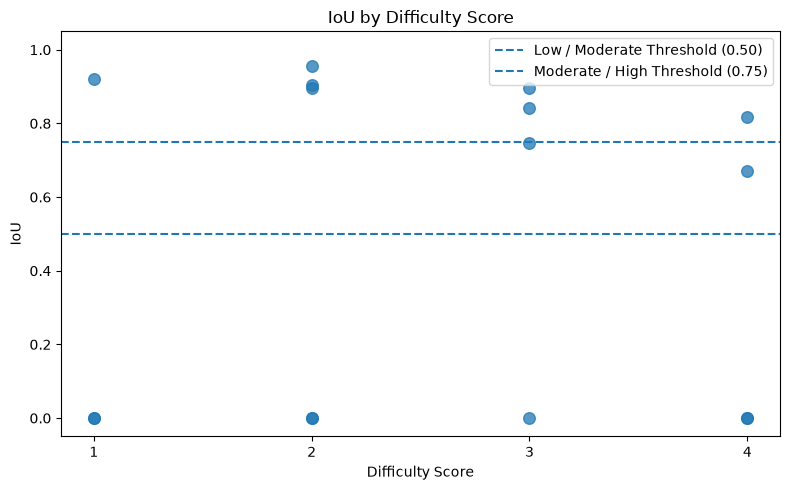

In [94]:
# EA-05-4. Visualize Difficulty Score vs IoU

plt.figure(figsize=(8, 5))

plt.scatter(
    analysis_df["difficulty_score"],
    analysis_df["iou"],
    s=70,
    alpha=0.75
)

# Consistency thresholds
plt.axhline(
    0.50,
    linestyle="--",
    linewidth=1.5,
    label="Low / Moderate Threshold (0.50)"
)

plt.axhline(
    0.75,
    linestyle="--",
    linewidth=1.5,
    label="Moderate / High Threshold (0.75)"
)

plt.title("IoU by Difficulty Score")
plt.xlabel("Difficulty Score")
plt.ylabel("IoU")

plt.xticks(
    sorted(analysis_df["difficulty_score"].unique())
)
plt.ylim(-0.05, 1.05)

plt.legend()
plt.tight_layout()
plt.show()

#### EA-05-5. Visualization Observation(시각화 관찰)

Difficulty Score(난이도 점수)와 IoU를 시각화한 결과,
난이도 점수가 증가함에 따라 IoU가 일관되게 감소하는 패턴은 관찰되지 않았다.

- Difficulty Score 1~4의 모든 구간에서 Zero-IoU 객체가 나타났다.
- 동일한 Difficulty Score 내에서도 IoU가 0인 객체와 높은 IoU를 가진 객체가
  동시에 관찰되었다.
- 특히 Score 2와 Score 3에서는 동일 점수 내 객체 간 IoU 차이가 크게 나타났다.
- 따라서 단순한 Difficulty Score 합계보다는 개별 Difficulty Factor(난이도 요인)의
  종류와 객체 특성을 함께 분석하는 것이 필요하다.

다음 단계에서는 Occlusion(가림), Truncation(잘림), Small/Distant(소형/원거리),
Ambiguity(모호성)를 각각 분리하여 IoU와의 관계를 분석한다.

### EA-06. Error by Attribute(속성별 오류 분석)

개별 Difficulty Factor(난이도 요인)가 Bounding Box Consistency
(바운딩 박스 일관성)와 어떤 관계를 보이는지 분석한다.

Difficulty Score(난이도 점수) 분석에서는 단순한 점수 증가와 IoU 감소 사이에
일관된 관계가 나타나지 않았으므로, 각 Attribute(속성)를 개별적으로 분리하여
Mean IoU(평균 IoU), Median IoU(중앙값), Zero-IoU Rate(Zero-IoU 비율)를 비교한다.

#### EA-06-1. Occlusion Analysis(가림 분석)

Occlusion(가림) 수준에 따라 IoU 분포와 Zero-IoU 발생 패턴에
차이가 나타나는지 확인한다.

In [95]:
# EA-06-1. Analyze IoU by Occlusion

occlusion_summary = (
    analysis_df
    .groupby("occlusion")
    .agg(
        sample_size=("iou", "size"),
        mean_iou=("iou", "mean"),
        median_iou=("iou", "median"),
        min_iou=("iou", "min"),
        max_iou=("iou", "max"),
        zero_iou_count=("iou", lambda x: (x == 0).sum())
    )
    .reset_index()
)

occlusion_summary["zero_iou_rate"] = (
    occlusion_summary["zero_iou_count"]
    / occlusion_summary["sample_size"]
    * 100
)

occlusion_summary[
    ["mean_iou", "median_iou", "min_iou", "max_iou"]
] = occlusion_summary[
    ["mean_iou", "median_iou", "min_iou", "max_iou"]
].round(3)

occlusion_summary["zero_iou_rate"] = (
    occlusion_summary["zero_iou_rate"].round(1)
)

# Logical order
occlusion_order = ["None", "Partial", "Heavy"]

occlusion_summary["occlusion"] = pd.Categorical(
    occlusion_summary["occlusion"],
    categories=occlusion_order,
    ordered=True
)

occlusion_summary = (
    occlusion_summary
    .sort_values("occlusion")
    .reset_index(drop=True)
)

print("=== IoU by Occlusion ===")
display(occlusion_summary)

=== IoU by Occlusion ===


,occlusion,sample_size,mean_iou,median_iou,min_iou,max_iou,zero_iou_count,zero_iou_rate
0,None,3,0.617,0.896,0.0,0.955,1,33.3
1,Partial,9,0.479,0.746,0.0,0.920,4,44.4
2,Heavy,4,0.372,0.336,0.0,0.817,2,50.0


#### EA-06-2. Occlusion Observation(가림 관찰)

Occlusion(가림) 수준별 IoU를 비교한 결과, 본 Pilot Sample(파일럿 표본)에서는
가림 수준이 높아질수록 Bounding Box Consistency(바운딩 박스 일관성)가
낮아지는 방향의 패턴이 관찰되었다.

- Occlusion=None의 Mean IoU(평균 IoU)는 0.617,
  Zero-IoU Rate는 33.3%였다.
- Occlusion=Partial에서는 Mean IoU가 0.479,
  Zero-IoU Rate는 44.4%로 나타났다.
- Occlusion=Heavy에서는 Mean IoU가 0.372로 가장 낮았으며,
  Zero-IoU Rate는 50.0%였다.
- Median IoU(중앙값) 역시 None 0.896, Partial 0.746,
  Heavy 0.336으로 감소하는 패턴을 보였다.

따라서 본 표본에서는 Occlusion 수준이 높아질수록 IoU가 낮아지는
탐색적 패턴이 관찰되었다. 다만 각 그룹의 Sample Size(표본 수)가 작으므로
Occlusion을 낮은 IoU의 직접적인 원인으로 일반화하지 않는다.

#### EA-06-3. Truncation Analysis(잘림 분석)

Truncation(잘림) 수준에 따라 Bounding Box Consistency
(바운딩 박스 일관성)에 차이가 나타나는지 확인한다.

각 Truncation 수준별 Sample Size(표본 수), Mean IoU(평균 IoU),
Median IoU(중앙값) 및 Zero-IoU Rate(Zero-IoU 비율)를 비교한다.

In [96]:
# EA-06-3. Analyze IoU by Truncation

truncation_summary = (
    analysis_df
    .groupby("truncation")
    .agg(
        sample_size=("iou", "size"),
        mean_iou=("iou", "mean"),
        median_iou=("iou", "median"),
        min_iou=("iou", "min"),
        max_iou=("iou", "max"),
        zero_iou_count=("iou", lambda x: (x == 0).sum())
    )
    .reset_index()
)

truncation_summary["zero_iou_rate"] = (
    truncation_summary["zero_iou_count"]
    / truncation_summary["sample_size"]
    * 100
)

truncation_summary[
    ["mean_iou", "median_iou", "min_iou", "max_iou"]
] = truncation_summary[
    ["mean_iou", "median_iou", "min_iou", "max_iou"]
].round(3)

truncation_summary["zero_iou_rate"] = (
    truncation_summary["zero_iou_rate"].round(1)
)

truncation_order = ["None", "Partial", "Heavy"]

truncation_summary["truncation"] = pd.Categorical(
    truncation_summary["truncation"],
    categories=truncation_order,
    ordered=True
)

truncation_summary = (
    truncation_summary
    .sort_values("truncation")
    .reset_index(drop=True)
)

print("=== IoU by Truncation ===")
display(truncation_summary)

=== IoU by Truncation ===


,truncation,sample_size,mean_iou,median_iou,min_iou,max_iou,zero_iou_count,zero_iou_rate
0,None,13,0.376,0.000,0.000,0.920,7,53.8
1,Partial,2,0.900,0.900,0.896,0.903,0,0.0
2,Heavy,1,0.955,0.955,0.955,0.955,0,0.0


#### EA-06-4. Truncation Observation(잘림 관찰)

Truncation(잘림) 수준별 IoU를 비교한 결과,
Truncation=None 그룹에서는 Mean IoU(평균 IoU)가 0.376,
Zero-IoU Rate가 53.8%로 나타났다.

반면 Partial 그룹의 Mean IoU는 0.900, Heavy 그룹은 0.955였으며
두 그룹에서는 Zero-IoU 사례가 관찰되지 않았다.

그러나 Sample Size(표본 수)는 None 13개, Partial 2개, Heavy 1개로
매우 불균형하다. 특히 Heavy 결과는 단일 객체의 결과이므로
Truncation 수준이 증가할수록 IoU가 높아진다고 해석할 수 없다.

따라서 본 Pilot Sample(파일럿 표본)에서는 Truncation과 IoU 사이의
일관된 관계를 판단하기 위한 충분한 표본이 확보되지 않았으며,
추가 Sample(표본)을 통한 검증이 필요하다.

#### EA-06-5. Small/Distant Analysis(소형/원거리 분석)

Small/Distant(소형/원거리) 여부에 따라 Bounding Box Consistency
(바운딩 박스 일관성)에 차이가 나타나는지 확인한다.

Small/Distant=True와 False 그룹의 Sample Size(표본 수),
Mean IoU(평균 IoU), Median IoU(중앙값) 및
Zero-IoU Rate(Zero-IoU 비율)를 비교한다.

In [97]:
# EA-06-5. Analyze IoU by Small/Distant

small_summary = (
    analysis_df
    .groupby("small_distant")
    .agg(
        sample_size=("iou", "size"),
        mean_iou=("iou", "mean"),
        median_iou=("iou", "median"),
        min_iou=("iou", "min"),
        max_iou=("iou", "max"),
        zero_iou_count=("iou", lambda x: (x == 0).sum())
    )
    .reset_index()
)

small_summary["zero_iou_rate"] = (
    small_summary["zero_iou_count"]
    / small_summary["sample_size"]
    * 100
)

small_summary[
    ["mean_iou", "median_iou", "min_iou", "max_iou"]
] = small_summary[
    ["mean_iou", "median_iou", "min_iou", "max_iou"]
].round(3)

small_summary["zero_iou_rate"] = (
    small_summary["zero_iou_rate"].round(1)
)

print("=== IoU by Small/Distant ===")
display(small_summary)

=== IoU by Small/Distant ===


,small_distant,sample_size,mean_iou,median_iou,min_iou,max_iou,zero_iou_count,zero_iou_rate
0,False,6,0.612,0.900,0.0,0.955,2,33.3
1,True,10,0.397,0.336,0.0,0.896,5,50.0


#### EA-06-6. Small/Distant Observation(소형/원거리 관찰)

Small/Distant(소형/원거리) 여부에 따른 IoU를 비교한 결과,
본 Pilot Sample(파일럿 표본)에서는 Small/Distant=True 그룹에서
상대적으로 낮은 Bounding Box Consistency(바운딩 박스 일관성)가 관찰되었다.

- Small/Distant=False 그룹의 Mean IoU(평균 IoU)는 0.612,
  Median IoU(중앙값)는 0.900이었다.
- Small/Distant=True 그룹의 Mean IoU는 0.397,
  Median IoU는 0.336으로 상대적으로 낮게 나타났다.
- Zero-IoU Rate는 False 그룹에서 33.3%, True 그룹에서 50.0%로 나타났다.
- Mean, Median 및 Zero-IoU Rate가 모두 Small/Distant=True 그룹에서
  낮은 일관성 방향의 패턴을 보였다.

따라서 본 표본에서는 Small/Distant 특성과 낮은 IoU 사이에 탐색적인
연관 패턴이 관찰되었다. 다만 Small/Distant 속성만으로 Zero-IoU 발생을
설명할 수 없으며, Class(클래스), 실제 Bounding Box Size(바운딩 박스 크기)
및 다른 Difficulty Factor(난이도 요인)와 함께 검토할 필요가 있다.

#### EA-06-7. Ambiguity Analysis(모호성 분석)

Ambiguity(모호성) 유형에 따라 Bounding Box Consistency
(바운딩 박스 일관성)에 차이가 나타나는지 확인한다.

Ambiguity=None, Boundary 및 Class 그룹의 Sample Size(표본 수),
Mean IoU(평균 IoU), Median IoU(중앙값) 및
Zero-IoU Rate(Zero-IoU 비율)를 비교한다.

In [98]:
# EA-06-7. Analyze IoU by Ambiguity

ambiguity_summary = (
    analysis_df
    .groupby("ambiguity")
    .agg(
        sample_size=("iou", "size"),
        mean_iou=("iou", "mean"),
        median_iou=("iou", "median"),
        min_iou=("iou", "min"),
        max_iou=("iou", "max"),
        zero_iou_count=("iou", lambda x: (x == 0).sum())
    )
    .reset_index()
)

ambiguity_summary["zero_iou_rate"] = (
    ambiguity_summary["zero_iou_count"]
    / ambiguity_summary["sample_size"]
    * 100
)

ambiguity_summary[
    ["mean_iou", "median_iou", "min_iou", "max_iou"]
] = ambiguity_summary[
    ["mean_iou", "median_iou", "min_iou", "max_iou"]
].round(3)

ambiguity_summary["zero_iou_rate"] = (
    ambiguity_summary["zero_iou_rate"].round(1)
)

ambiguity_order = ["None", "Boundary", "Class"]

ambiguity_summary["ambiguity"] = pd.Categorical(
    ambiguity_summary["ambiguity"],
    categories=ambiguity_order,
    ordered=True
)

ambiguity_summary = (
    ambiguity_summary
    .sort_values("ambiguity")
    .reset_index(drop=True)
)

print("=== IoU by Ambiguity ===")
display(ambiguity_summary)

=== IoU by Ambiguity ===


,ambiguity,sample_size,mean_iou,median_iou,min_iou,max_iou,zero_iou_count,zero_iou_rate
0,None,6,0.463,0.451,0.000,0.955,3,50.0
1,Boundary,6,0.274,0.000,0.000,0.896,4,66.7
2,Class,4,0.807,0.830,0.671,0.896,0,0.0


#### EA-06-8. Ambiguity Observation(모호성 관찰)

Ambiguity(모호성) 유형별 IoU를 비교한 결과,
Boundary Ambiguity(경계 모호성) 그룹에서 상대적으로 낮은
Bounding Box Consistency(바운딩 박스 일관성)가 관찰되었다.

- Ambiguity=None 그룹의 Mean IoU(평균 IoU)는 0.463,
  Median IoU(중앙값)는 0.451, Zero-IoU Rate는 50.0%였다.
- Boundary 그룹의 Mean IoU는 0.274, Median IoU는 0.000으로 나타났으며,
  Zero-IoU Rate는 66.7%로 세 그룹 중 가장 높았다.
- Class 그룹의 Mean IoU는 0.807, Median IoU는 0.830으로 나타났으며,
  Zero-IoU 사례는 관찰되지 않았다.
- 앞선 Class Agreement(클래스 일치도) 분석에서는 16개 객체 모두
  Reference Class(기준 클래스)와 Repeat Class(반복 클래스)가 일치하였다.

따라서 본 Pilot Sample(파일럿 표본)에서는 Class Ambiguity(클래스 모호성)보다
Boundary Ambiguity(경계 모호성)가 낮은 IoU와 함께 나타나는 탐색적 패턴이
관찰되었다. 다만 제한된 Sample Size(표본 수)를 고려하여 일반화하지 않는다.

#### EA-06-9. Attribute Analysis Summary(속성 분석 요약)

개별 Attribute(속성)와 IoU의 관계를 분석한 결과 다음과 같은
탐색적 패턴이 확인되었다.

| Attribute(속성) | 주요 관찰 결과 |
|---|---|
| Occlusion(가림) | None → Partial → Heavy 순으로 Mean 및 Median IoU가 감소하는 패턴이 관찰됨 |
| Truncation(잘림) | 그룹 간 Sample Size 차이가 커 일관된 관계를 판단하기 어려움 |
| Small/Distant(소형/원거리) | True 그룹에서 Mean 및 Median IoU가 낮고 Zero-IoU Rate가 높게 나타남 |
| Ambiguity(모호성) | Boundary 그룹에서 가장 낮은 Mean IoU와 높은 Zero-IoU Rate가 관찰됨 |

Difficulty Score(난이도 점수)의 단순 합계에서는 IoU와 일관된 관계가
확인되지 않았지만, 개별 Attribute를 분리하여 분석했을 때
Occlusion, Small/Distant 및 Boundary Ambiguity에서 낮은 IoU와 함께
나타나는 패턴이 관찰되었다.

따라서 Bounding Box Error(바운딩 박스 오류)를 분석할 때는
단순한 난이도 점수보다 개별 객체의 Attribute 조합과 실제 Bounding Box 특성을
함께 검토하는 것이 더 적절하다.

본 결과는 16개 Repeat Labeling(반복 라벨링) 표본에 대한
Exploratory Analysis(탐색적 분석)이며 인과관계를 의미하지 않는다.

### EA-07. Bounding Box Error Pattern(바운딩 박스 오류 패턴)

Reference Bounding Box(기준 바운딩 박스)와 Repeat Bounding Box(반복 바운딩 박스)의
위치와 크기 차이를 정량적으로 분석한다.

IoU만으로는 Bounding Box 불일치가 위치 이동 때문인지, 크기 차이 때문인지,
또는 서로 다른 객체가 선택된 것인지 구분하기 어렵다.

따라서 다음 지표를 계산하여 Bounding Box Error Pattern(바운딩 박스 오류 패턴)을
세부적으로 분석한다.

- Center Distance(중심점 거리): 두 Bounding Box 중심점 사이의 거리
- Width Difference(너비 차이): Reference와 Repeat Box의 너비 차이
- Height Difference(높이 차이): Reference와 Repeat Box의 높이 차이
- Area Ratio(면적 비율): Repeat Box 면적 대비 Reference Box 면적의 비율

이를 통해 Zero-IoU 사례에서 나타나는 Localization Difference(위치 차이)와
Bounding Box Size Difference(바운딩 박스 크기 차이)를 구분하여 확인한다.

In [99]:
# EA-07-1. Calculate Bounding Box Error Metrics

bbox_analysis_df = analysis_df.copy()

# Reference box size
bbox_analysis_df["ref_width"] = (
    bbox_analysis_df["ref_x_max"] - bbox_analysis_df["ref_x_min"]
)

bbox_analysis_df["ref_height"] = (
    bbox_analysis_df["ref_y_max"] - bbox_analysis_df["ref_y_min"]
)

bbox_analysis_df["ref_area"] = (
    bbox_analysis_df["ref_width"] * bbox_analysis_df["ref_height"]
)

# Repeat box size
bbox_analysis_df["repeat_width"] = (
    bbox_analysis_df["repeat_x_max"] - bbox_analysis_df["repeat_x_min"]
)

bbox_analysis_df["repeat_height"] = (
    bbox_analysis_df["repeat_y_max"] - bbox_analysis_df["repeat_y_min"]
)

bbox_analysis_df["repeat_area"] = (
    bbox_analysis_df["repeat_width"] * bbox_analysis_df["repeat_height"]
)

# Center coordinates
bbox_analysis_df["ref_center_x"] = (
    bbox_analysis_df["ref_x_min"] + bbox_analysis_df["ref_x_max"]
) / 2

bbox_analysis_df["ref_center_y"] = (
    bbox_analysis_df["ref_y_min"] + bbox_analysis_df["ref_y_max"]
) / 2

bbox_analysis_df["repeat_center_x"] = (
    bbox_analysis_df["repeat_x_min"] + bbox_analysis_df["repeat_x_max"]
) / 2

bbox_analysis_df["repeat_center_y"] = (
    bbox_analysis_df["repeat_y_min"] + bbox_analysis_df["repeat_y_max"]
) / 2

# Center distance
bbox_analysis_df["center_distance"] = np.sqrt(
    (bbox_analysis_df["repeat_center_x"] - bbox_analysis_df["ref_center_x"]) ** 2
    + (bbox_analysis_df["repeat_center_y"] - bbox_analysis_df["ref_center_y"]) ** 2
)

# Absolute size differences
bbox_analysis_df["width_diff"] = abs(
    bbox_analysis_df["repeat_width"] - bbox_analysis_df["ref_width"]
)

bbox_analysis_df["height_diff"] = abs(
    bbox_analysis_df["repeat_height"] - bbox_analysis_df["ref_height"]
)

# Area ratio
bbox_analysis_df["area_ratio"] = (
    bbox_analysis_df["repeat_area"] / bbox_analysis_df["ref_area"]
)

print("=== Bounding Box Error Metrics Created ===")
print(f"Shape: {bbox_analysis_df.shape}")

display(
    bbox_analysis_df[
        [
            "image_name",
            "reference_object_id",
            "reference_class",
            "iou",
            "center_distance",
            "width_diff",
            "height_diff",
            "area_ratio"
        ]
    ].round(3)
)

=== Bounding Box Error Metrics Created ===
Shape: (16, 34)


,image_name,reference_object_id,reference_class,iou,center_distance,width_diff,height_diff,area_ratio
0,image_01.jpg,C01_OBJ_002,Barrier,0.903,5.644,3.38,2.27,1.005
1,image_01.jpg,C01_OBJ_007,Construction Vehicle,0.920,1.015,0.23,4.51,0.926
2,image_02.jpg,C02_OBJ_001,Car,0.000,157.393,0.41,7.56,0.740
3,image_02.jpg,C02_OBJ_004,Car,0.955,1.994,3.80,1.13,0.955
4,image_03.jpg,C03_OBJ_002,Car,0.817,1.903,2.31,0.83,1.060
5,image_03.jpg,C03_OBJ_005,Truck,0.896,1.503,0.64,0.71,0.959
6,image_04.jpg,C04_OBJ_014,Car,0.843,2.346,1.58,1.48,0.917
7,image_04.jpg,C04_OBJ_008,Traffic Cone,0.000,54.346,4.17,8.64,2.805
8,image_05.jpg,C05_OBJ_003,Car,0.671,5.202,3.38,6.77,0.780
9,image_05.jpg,C05_OBJ_001,Pedestrian,0.000,955.311,2.20,29.32,1.185


#### EA-07-2. Zero-IoU vs Non-zero IoU Comparison(그룹 비교)

Zero-IoU 객체와 Non-zero IoU 객체의 Bounding Box Error Metric
(바운딩 박스 오류 지표)을 비교한다.

두 그룹의 Center Distance(중심점 거리), Width Difference(너비 차이),
Height Difference(높이 차이), Area Ratio(면적 비율)를 비교하여
Zero-IoU 발생에서 위치 이동과 크기 차이가 어떤 패턴을 보이는지 확인한다.

본 비교는 16개 Pilot Sample(파일럿 표본)을 대상으로 한
Exploratory Analysis(탐색적 분석)이며, 오류 발생의 인과관계를
검증하기 위한 통계적 분석은 아니다.

In [100]:
# EA-07-2. Compare Zero-IoU and Non-zero IoU groups

bbox_analysis_df["iou_group"] = np.where(
    bbox_analysis_df["iou"] == 0,
    "Zero IoU",
    "Non-zero IoU"
)

bbox_group_summary = (
    bbox_analysis_df
    .groupby("iou_group")
    .agg(
        sample_size=("iou", "size"),
        mean_center_distance=("center_distance", "mean"),
        median_center_distance=("center_distance", "median"),
        mean_width_diff=("width_diff", "mean"),
        mean_height_diff=("height_diff", "mean"),
        median_area_ratio=("area_ratio", "median")
    )
    .reset_index()
)

metric_cols = [
    "mean_center_distance",
    "median_center_distance",
    "mean_width_diff",
    "mean_height_diff",
    "median_area_ratio"
]

bbox_group_summary[metric_cols] = (
    bbox_group_summary[metric_cols].round(3)
)

print("=== Zero-IoU vs Non-zero IoU ===")
display(bbox_group_summary)

=== Zero-IoU vs Non-zero IoU ===


,iou_group,sample_size,mean_center_distance,median_center_distance,mean_width_diff,mean_height_diff,median_area_ratio
0,Non-zero IoU,9,2.564,1.994,2.311,2.414,0.955
1,Zero IoU,7,214.663,57.011,7.243,9.677,0.946


#### EA-07-3. Center Distance Visualization(중심점 거리 시각화)

각 객체의 Center Distance(중심점 거리)와 IoU를 시각화하여
Bounding Box 위치 차이와 IoU 사이의 관계를 확인한다.

특히 Zero-IoU 객체에서 매우 큰 위치 이동이 나타나는 사례와
작은 위치 차이에도 IoU가 0이 되는 사례를 함께 확인한다.

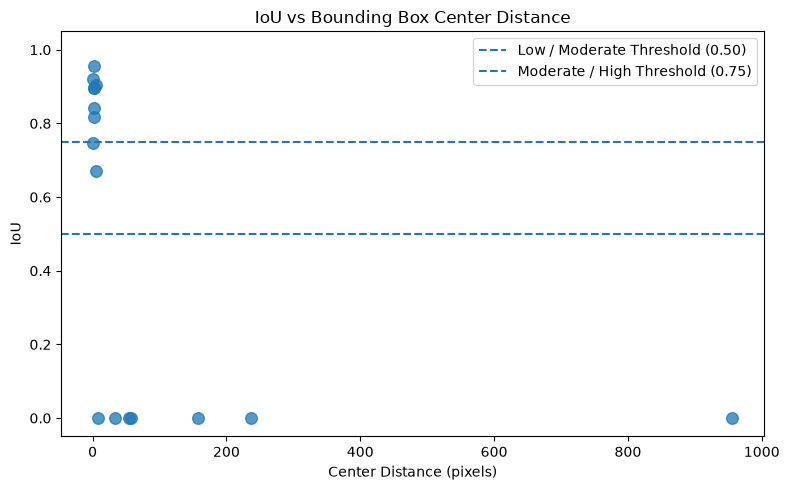

In [101]:
# EA-07-3. Visualize Center Distance vs IoU

plt.figure(figsize=(8, 5))

plt.scatter(
    bbox_analysis_df["center_distance"],
    bbox_analysis_df["iou"],
    s=70,
    alpha=0.75
)

plt.axhline(
    0.50,
    linestyle="--",
    linewidth=1.5,
    label="Low / Moderate Threshold (0.50)"
)

plt.axhline(
    0.75,
    linestyle="--",
    linewidth=1.5,
    label="Moderate / High Threshold (0.75)"
)

plt.title("IoU vs Bounding Box Center Distance")
plt.xlabel("Center Distance (pixels)")
plt.ylabel("IoU")
plt.ylim(-0.05, 1.05)

plt.legend()
plt.tight_layout()
plt.show()

#### EA-07-4. Normalized Center Distance(정규화 중심점 거리)

절대적인 Center Distance(중심점 거리)는 객체의 Bounding Box Size
(바운딩 박스 크기)를 고려하지 않기 때문에 Small Object(소형 객체)와
Large Object(대형 객체)를 직접 비교하기 어렵다.

이를 보완하기 위해 Reference Bounding Box(기준 바운딩 박스)의
Diagonal Length(대각선 길이)를 기준으로 Center Distance를 정규화한다.

**Normalized Center Distance = Center Distance / Reference Box Diagonal**

Normalized Center Distance가 클수록 객체 크기에 비해
Reference와 Repeat Bounding Box의 중심점 차이가 크다는 것을 의미한다.

본 지표는 Error Pattern(오류 패턴)을 비교하기 위한
Project-specific Metric(프로젝트별 지표)이며,
표준적인 라벨링 품질 기준을 의미하지 않는다.

In [102]:
# EA-07-4. Calculate Normalized Center Distance

bbox_analysis_df["ref_diagonal"] = np.sqrt(
    bbox_analysis_df["ref_width"] ** 2
    + bbox_analysis_df["ref_height"] ** 2
)

bbox_analysis_df["normalized_center_distance"] = (
    bbox_analysis_df["center_distance"]
    / bbox_analysis_df["ref_diagonal"]
)

print("=== Normalized Center Distance ===")

display(
    bbox_analysis_df[
        [
            "image_name",
            "reference_object_id",
            "reference_class",
            "iou",
            "ref_width",
            "ref_height",
            "center_distance",
            "normalized_center_distance"
        ]
    ]
    .sort_values("normalized_center_distance", ascending=False)
    .round(3)
)

=== Normalized Center Distance ===


,image_name,reference_object_id,reference_class,iou,ref_width,ref_height,center_distance,normalized_center_distance
9,image_05.jpg,C05_OBJ_001,Pedestrian,0.000,55.20,125.19,955.311,6.982
2,image_02.jpg,C02_OBJ_001,Car,0.000,34.33,30.17,157.393,3.444
7,image_04.jpg,C04_OBJ_008,Traffic Cone,0.000,5.01,16.28,54.346,3.191
13,image_07.jpg,C07_OBJ_003,Car,0.000,75.77,26.20,237.107,2.957
10,image_06.jpg,C06_OBJ_001,Traffic Cone,0.000,8.60,26.40,57.011,2.053
11,image_06.jpg,C06_OBJ_004,Traffic Cone,0.000,11.10,27.10,33.556,1.146
14,image_08.jpg,C08_OBJ_005,Traffic Cone,0.000,9.40,17.28,7.919,0.403
8,image_05.jpg,C05_OBJ_003,Car,0.671,30.45,55.27,5.202,0.082
4,image_03.jpg,C03_OBJ_002,Car,0.817,24.51,26.43,1.903,0.053
6,image_04.jpg,C04_OBJ_014,Car,0.843,32.75,41.08,2.346,0.045


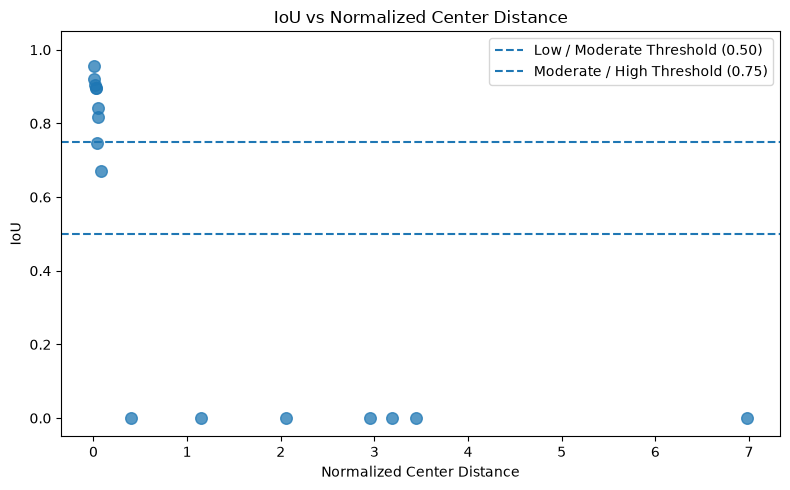

In [103]:
# EA-07-5. Visualize Normalized Center Distance vs IoU

plt.figure(figsize=(8, 5))

plt.scatter(
    bbox_analysis_df["normalized_center_distance"],
    bbox_analysis_df["iou"],
    s=70,
    alpha=0.75
)

plt.axhline(
    0.50,
    linestyle="--",
    linewidth=1.5,
    label="Low / Moderate Threshold (0.50)"
)

plt.axhline(
    0.75,
    linestyle="--",
    linewidth=1.5,
    label="Moderate / High Threshold (0.75)"
)

plt.title("IoU vs Normalized Center Distance")
plt.xlabel("Normalized Center Distance")
plt.ylabel("IoU")
plt.ylim(-0.05, 1.05)

plt.legend()
plt.tight_layout()
plt.show()

#### EA-07-6. Normalized Distance Observation(정규화 거리 관찰)

Bounding Box Size(바운딩 박스 크기)를 고려하여 Center Distance(중심점 거리)를
정규화한 결과, Zero-IoU와 Non-zero IoU 객체 사이에서 뚜렷한 차이가 관찰되었다.

- Non-zero IoU 객체의 Normalized Center Distance(정규화 중심점 거리)는
  약 0.004~0.082 범위에 분포하였다.
- Zero-IoU 객체는 약 0.403~6.982 범위에 분포하여,
  본 Pilot Sample(파일럿 표본)에서는 두 그룹이 서로 겹치지 않았다.
- `image_08.jpg / C08_OBJ_005`는 절대 Center Distance가 7.919 Pixel(픽셀)로
  작아 보였지만, 정규화된 값은 0.403으로 나타났다.
  이는 Small Object(소형 객체)에서는 비교적 작은 Pixel 이동도 객체 크기 대비
  큰 Localization Difference(위치 차이)가 될 수 있음을 보여준다.
- `image_05.jpg / C05_OBJ_001`은 Normalized Center Distance가 6.982로
  매우 크게 나타나 Object Matching(객체 매칭) 또는 Object Selection(객체 선택)
  차이의 가능성을 실제 이미지에서 추가 검토할 필요가 있다.

따라서 객체 크기를 고려한 Normalized Center Distance가 절대 Pixel Distance보다
Bounding Box Localization Error(바운딩 박스 위치 오류)를 비교하는 데
더 유용한 보조 지표로 나타났다.

단, 본 결과는 16개 객체에 대한 탐색적 분석이며 0.082 또는 0.403을
일반적인 품질 Threshold(임계값)로 해석하지 않는다.

#### EA-07-7. Zero-IoU Error Pattern Classification(오류 패턴 분류)

Zero-IoU 사례를 추가 검토하기 위해 Normalized Center Distance
(정규화 중심점 거리)를 기반으로 Candidate Error Pattern(후보 오류 패턴)을
탐색적으로 분류한다.

본 분류는 오류 원인을 자동으로 확정하기 위한 기준이 아니라,
Visual Inspection(시각적 검토)이 필요한 사례를 체계적으로 구분하기 위한
Project-specific Rule(프로젝트별 규칙)이다.

- Moderate Localization Shift(중간 위치 이동): 0.3 ≤ Normalized Distance < 1.0
- Large Localization Shift(큰 위치 이동): 1.0 ≤ Normalized Distance < 3.0
- Potential Object Mismatch(잠재적 객체 불일치): Normalized Distance ≥ 3.0

최종 Error Type(오류 유형)은 실제 이미지를 확인한 후 결정한다.

In [104]:
# EA-07-7. Classify candidate error patterns for Zero-IoU cases

zero_error_df = bbox_analysis_df[
    bbox_analysis_df["iou"] == 0
].copy()

def classify_candidate_error(distance):
    if distance >= 3.0:
        return "Potential Object Mismatch"
    elif distance >= 1.0:
        return "Large Localization Shift"
    elif distance >= 0.3:
        return "Moderate Localization Shift"
    else:
        return "Minor Localization Difference"

zero_error_df["candidate_error_pattern"] = (
    zero_error_df["normalized_center_distance"]
    .apply(classify_candidate_error)
)

zero_error_review = zero_error_df[
    [
        "image_name",
        "reference_object_id",
        "reference_class",
        "center_distance",
        "normalized_center_distance",
        "area_ratio",
        "candidate_error_pattern"
    ]
].sort_values(
    "normalized_center_distance",
    ascending=False
)

print("=== Zero-IoU Candidate Error Patterns ===")
display(zero_error_review.round(3))

print("\n=== Candidate Pattern Distribution ===")
print(
    zero_error_df["candidate_error_pattern"]
    .value_counts()
)

=== Zero-IoU Candidate Error Patterns ===


,image_name,reference_object_id,reference_class,center_distance,normalized_center_distance,area_ratio,candidate_error_pattern
9,image_05.jpg,C05_OBJ_001,Pedestrian,955.311,6.982,1.185,Potential Object Mismatch
2,image_02.jpg,C02_OBJ_001,Car,157.393,3.444,0.740,Potential Object Mismatch
7,image_04.jpg,C04_OBJ_008,Traffic Cone,54.346,3.191,2.805,Potential Object Mismatch
13,image_07.jpg,C07_OBJ_003,Car,237.107,2.957,0.654,Large Localization Shift
10,image_06.jpg,C06_OBJ_001,Traffic Cone,57.011,2.053,1.073,Large Localization Shift
11,image_06.jpg,C06_OBJ_004,Traffic Cone,33.556,1.146,0.946,Large Localization Shift
14,image_08.jpg,C08_OBJ_005,Traffic Cone,7.919,0.403,0.806,Moderate Localization Shift



=== Candidate Pattern Distribution ===
candidate_error_pattern
Potential Object Mismatch      3
Large Localization Shift       3
Moderate Localization Shift    1
Name: count, dtype: int64


#### EA-07-8. Visual Error Review(시각적 오류 검토)

좌표 기반 분석에서 분류된 Candidate Error Pattern(후보 오류 패턴)을
실제 이미지와 비교하여 검증한다.

Normalized Center Distance(정규화 중심점 거리)는 Bounding Box의 위치 차이를
정량화할 수 있지만, 실제로 동일 객체를 다르게 라벨링한 것인지
서로 다른 객체를 선택한 것인지는 좌표만으로 확정할 수 없다.

따라서 Zero-IoU 7개 사례에 대해 Reference Bounding Box(기준 바운딩 박스)와
Repeat Bounding Box(반복 바운딩 박스)를 실제 이미지에 함께 표시하여
Visual Inspection(시각적 검토)을 수행한다.

검토 결과는 다음 항목으로 기록한다.

- Same Object(동일 객체) 여부
- Final Error Type(최종 오류 유형)
- Review Note(검토 메모)

In [105]:
# EA-07-8. Prepare Visual Review Table

visual_review_df = zero_error_review.copy()

visual_review_df["same_object"] = ""
visual_review_df["final_error_type"] = ""
visual_review_df["review_note"] = ""

visual_review_df = visual_review_df[
    [
        "image_name",
        "reference_object_id",
        "reference_class",
        "center_distance",
        "normalized_center_distance",
        "area_ratio",
        "candidate_error_pattern",
        "same_object",
        "final_error_type",
        "review_note"
    ]
].reset_index(drop=True)

print("=== Zero-IoU Visual Review Table ===")
display(visual_review_df)

=== Zero-IoU Visual Review Table ===


,image_name,reference_object_id,reference_class,center_distance,normalized_center_distance,area_ratio,candidate_error_pattern,same_object,final_error_type,review_note
0,image_05.jpg,C05_OBJ_001,Pedestrian,955.310646,6.982270,1.185015,Potential Object Mismatch,,,
1,image_02.jpg,C02_OBJ_001,Car,157.392828,3.443807,0.740470,Potential Object Mismatch,,,
2,image_04.jpg,C04_OBJ_008,Traffic Cone,54.346366,3.190567,2.804779,Potential Object Mismatch,,,
3,image_07.jpg,C07_OBJ_003,Car,237.106903,2.957482,0.653728,Large Localization Shift,,,
4,image_06.jpg,C06_OBJ_001,Traffic Cone,57.010703,2.053297,1.073441,Large Localization Shift,,,
5,image_06.jpg,C06_OBJ_004,Traffic Cone,33.556072,1.145839,0.945746,Large Localization Shift,,,
6,image_08.jpg,C08_OBJ_005,Traffic Cone,7.918619,0.402548,0.806133,Moderate Localization Shift,,,


#### EA-07-9. Visual Inspection of Zero-IoU Cases(Zero-IoU 사례 시각적 검토)

Zero-IoU 사례의 Candidate Error Pattern(후보 오류 패턴)을 검증하기 위해
Reference Bounding Box(기준 바운딩 박스)와 Repeat Bounding Box(반복 바운딩 박스)를
원본 이미지 위에 동시에 시각화한다.

첫 번째 검토 대상은 Normalized Center Distance(정규화 중심점 거리)가 가장 큰
`image_05.jpg / C05_OBJ_001` Pedestrian(보행자) 객체이다.

두 Bounding Box가 동일 객체를 가리키는지 확인하여
Object Matching Error(객체 매칭 오류)인지 Localization Error(위치 오류)인지
판단한다.

In [106]:
# EA-07-9A. Search for pilot image files

image_files = sorted(
    p for p in project_dir.rglob("image_05.jpg")
    if p.is_file()
)

print("=== image_05.jpg Search Results ===")
print(f"Files found: {len(image_files)}")

for path in image_files:
    print(path.relative_to(project_dir))

=== image_05.jpg Search Results ===
Files found: 0


#### EA-07-9B. Image Mapping Check(이미지 매핑 확인)

Pilot Dataset(파일럿 데이터셋)에서 사용한 분석용 Image Name(이미지 이름)과
nuImages 원본 이미지 파일 간의 Mapping(매핑) 정보를 확인한다.

`image_mapping.csv`를 이용하여 `image_05.jpg`에 대응하는
Original Image(원본 이미지)의 파일명 또는 경로를 확인한다.

In [107]:
# EA-07-9B. Load image mapping data

mapping_path = project_dir / "data" / "pilot" / "image_mapping.csv"

mapping_df = pd.read_csv(mapping_path)

print("=== Image Mapping Data ===")
print(f"Shape: {mapping_df.shape}")

print("\nColumns:")
print(mapping_df.columns.tolist())

print("\nMapping Preview:")
display(mapping_df)

=== Image Mapping Data ===
Shape: (8, 3)

Columns:
['alias_image', 'candidate_id', 'original_image']

Mapping Preview:


,alias_image,candidate_id,original_image
0,image_01.jpg,1,n006-2018-09-17-12-15-45-0400__CAM_FRONT__1537...
1,image_02.jpg,2,n008-2018-03-14-15-16-29-0400__CAM_FRONT__1521...
2,image_03.jpg,3,n008-2018-05-21-11-06-59-0400__CAM_FRONT__1526...
3,image_04.jpg,4,n008-2018-09-18-14-18-33-0400__CAM_FRONT__1537...
4,image_05.jpg,5,n009-2018-09-12-09-59-51-0400__CAM_FRONT__1536...
5,image_06.jpg,6,n013-2018-08-01-16-46-39+0800__CAM_FRONT__1533...
6,image_07.jpg,7,n013-2018-08-20-14-38-24+0800__CAM_FRONT__1534...
7,image_08.jpg,8,n016-2018-07-04-10-44-39+0800__CAM_FRONT__1530...


#### EA-07-9C. Locate Original Image(원본 이미지 위치 확인)

Image Mapping(이미지 매핑) 정보를 이용하여 `image_05.jpg`에 대응하는
Original Image Name(원본 이미지명)을 확인하고,
Project Directory(프로젝트 디렉터리)에서 실제 이미지 파일의 위치를 검색한다.

In [108]:
# EA-07-9C. Locate original image for image_05.jpg

target_alias = "image_05.jpg"

original_image_name = mapping_df.loc[
    mapping_df["alias_image"] == target_alias,
    "original_image"
].iloc[0]

print("=== Image Mapping ===")
print(f"Alias Image: {target_alias}")
print(f"Original Image: {original_image_name}")

# Search original image in project directory
original_matches = [
    p for p in project_dir.rglob(original_image_name)
    if p.is_file()
]

print("\n=== Original Image Search Results ===")
print(f"Files found: {len(original_matches)}")

for path in original_matches:
    print(path.relative_to(project_dir))

=== Image Mapping ===
Alias Image: image_05.jpg
Original Image: n009-2018-09-12-09-59-51-0400__CAM_FRONT__1536761961012656.jpg

=== Original Image Search Results ===
Files found: 2
data\pilot\n009-2018-09-12-09-59-51-0400__CAM_FRONT__1536761961012656.jpg
data\raw\samples\CAM_FRONT\n009-2018-09-12-09-59-51-0400__CAM_FRONT__1536761961012656.jpg


#### EA-07-9D. Reference vs Repeat Box Visualization(박스 비교 시각화)

`image_05.jpg / C05_OBJ_001` 사례의 Candidate Error Pattern(후보 오류 패턴)을
검증하기 위해 Original Image(원본 이미지)에 Reference Bounding Box
(기준 바운딩 박스)와 Repeat Bounding Box(반복 바운딩 박스)를 동시에 표시한다.

두 Bounding Box가 동일한 Pedestrian(보행자)을 가리키는지 확인하여
Potential Object Mismatch(잠재적 객체 불일치) 여부를 검토한다.

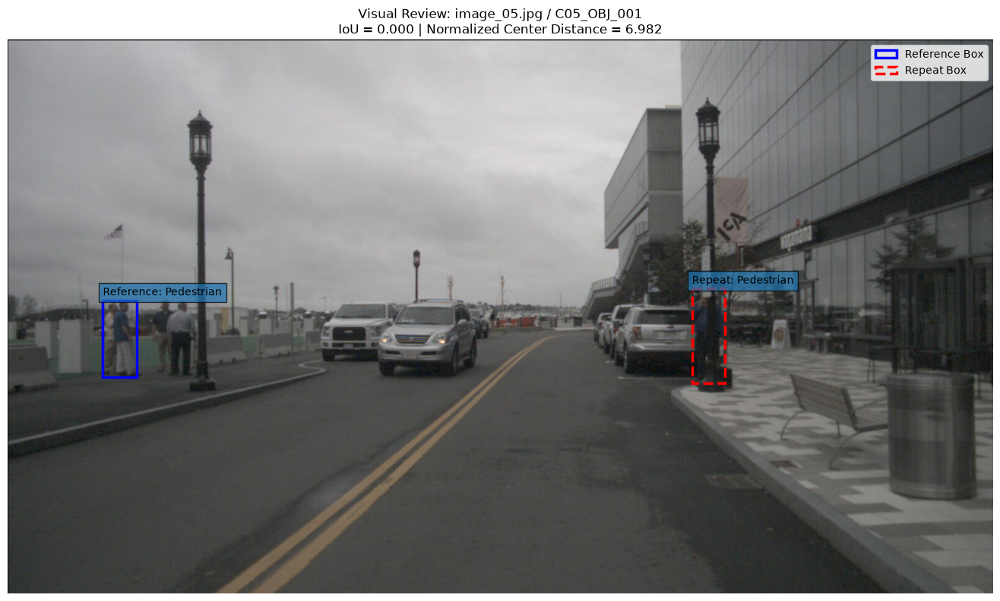

In [109]:
# EA-07-9D. Visualize Reference and Repeat Bounding Boxes

from PIL import Image
import matplotlib.patches as patches

# Use pilot image
image_path = project_dir / "data" / "pilot" / original_image_name

# Target object
target_object_id = "C05_OBJ_001"

target_row = bbox_analysis_df[
    (bbox_analysis_df["image_name"] == "image_05.jpg")
    & (bbox_analysis_df["reference_object_id"] == target_object_id)
].iloc[0]

# Load image
img = Image.open(image_path)

fig, ax = plt.subplots(figsize=(14, 8))
ax.imshow(img)

# Reference Bounding Box
ref_rect = patches.Rectangle(
    (target_row["ref_x_min"], target_row["ref_y_min"]),
    target_row["ref_x_max"] - target_row["ref_x_min"],
    target_row["ref_y_max"] - target_row["ref_y_min"],
    linewidth=2.5,
    edgecolor="blue",
    facecolor="none",
    linestyle="-",
    label="Reference Box"
)

# Repeat Bounding Box
repeat_rect = patches.Rectangle(
    (target_row["repeat_x_min"], target_row["repeat_y_min"]),
    target_row["repeat_x_max"] - target_row["repeat_x_min"],
    target_row["repeat_y_max"] - target_row["repeat_y_min"],
    linewidth=2.5,
    edgecolor="red",
    facecolor="none",
    linestyle="--",
    label="Repeat Box"
)

ax.add_patch(ref_rect)
ax.add_patch(repeat_rect)

# Labels
ax.text(
    target_row["ref_x_min"],
    target_row["ref_y_min"] - 8,
    "Reference: Pedestrian",
    fontsize=10,
    bbox=dict(alpha=0.7)
)

ax.text(
    target_row["repeat_x_min"],
    target_row["repeat_y_min"] - 8,
    "Repeat: Pedestrian",
    fontsize=10,
    bbox=dict(alpha=0.7)
)

ax.set_title(
    "Visual Review: image_05.jpg / C05_OBJ_001\n"
    f"IoU = {target_row['iou']:.3f} | "
    f"Normalized Center Distance = "
    f"{target_row['normalized_center_distance']:.3f}"
)

ax.legend()
ax.axis("off")

plt.tight_layout()
plt.show()

#### EA-07-10. Case 1 Review Result(사례 1 검토 결과)

`image_05.jpg / C05_OBJ_001`의 Reference Bounding Box(기준 바운딩 박스)와
Repeat Bounding Box(반복 바운딩 박스)를 실제 이미지에서 비교하였다.

Visual Inspection(시각적 검토) 결과, 두 Bounding Box는 동일한 Pedestrian(보행자)이
아니라 이미지의 서로 다른 위치에 있는 별개의 보행자를 가리키고 있었다.

따라서 본 사례의 Final Error Type(최종 오류 유형)은
**Object Matching Error(객체 매칭 오류)**로 분류하였다.

- IoU: 0.000
- Center Distance(중심점 거리): 955.311 Pixel(픽셀)
- Normalized Center Distance(정규화 중심점 거리): 6.982
- Same Object(동일 객체): No
- Final Error Type(최종 오류 유형): Object Matching Error
- Root Cause(원인): Repeat Labeling(반복 라벨링) 과정에서 Reference와 다른
  동일 Class(클래스)의 객체를 선택함

이 사례는 Class Agreement(클래스 일치도)가 유지되더라도
Object Identity(객체 식별)가 일치하지 않으면 IoU가 0이 될 수 있음을 보여준다.

In [110]:
# EA-07-10. Update Case 1 Visual Review Result

case_mask = (
    (visual_review_df["image_name"] == "image_05.jpg")
    & (visual_review_df["reference_object_id"] == "C05_OBJ_001")
)

visual_review_df.loc[case_mask, "same_object"] = "No"
visual_review_df.loc[case_mask, "final_error_type"] = "Object Matching Error"
visual_review_df.loc[case_mask, "review_note"] = (
    "Reference and repeat boxes indicate different pedestrians."
)

display(visual_review_df)

,image_name,reference_object_id,reference_class,center_distance,normalized_center_distance,area_ratio,candidate_error_pattern,same_object,final_error_type,review_note
0,image_05.jpg,C05_OBJ_001,Pedestrian,955.310646,6.982270,1.185015,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
1,image_02.jpg,C02_OBJ_001,Car,157.392828,3.443807,0.740470,Potential Object Mismatch,,,
2,image_04.jpg,C04_OBJ_008,Traffic Cone,54.346366,3.190567,2.804779,Potential Object Mismatch,,,
3,image_07.jpg,C07_OBJ_003,Car,237.106903,2.957482,0.653728,Large Localization Shift,,,
4,image_06.jpg,C06_OBJ_001,Traffic Cone,57.010703,2.053297,1.073441,Large Localization Shift,,,
5,image_06.jpg,C06_OBJ_004,Traffic Cone,33.556072,1.145839,0.945746,Large Localization Shift,,,
6,image_08.jpg,C08_OBJ_005,Traffic Cone,7.918619,0.402548,0.806133,Moderate Localization Shift,,,


#### EA-07-11. Zero-IoU Visual Review Automation(시각적 검토 자동화)

Zero-IoU 7개 사례를 동일한 방식으로 검토하기 위해
Image Mapping(이미지 매핑), Original Image(원본 이미지),
Reference/Repeat Bounding Box 정보를 연결하여
Visual Review(시각적 검토) 과정을 자동화한다.

In [111]:
# EA-07-11. Visualize a Zero-IoU case

def visualize_zero_iou_case(alias_image, object_id):

    # Find original image name
    original_name = mapping_df.loc[
        mapping_df["alias_image"] == alias_image,
        "original_image"
    ].iloc[0]

    image_path = project_dir / "data" / "pilot" / original_name

    # Find object data
    row = bbox_analysis_df[
        (bbox_analysis_df["image_name"] == alias_image)
        & (bbox_analysis_df["reference_object_id"] == object_id)
    ].iloc[0]

    # Load image
    img = Image.open(image_path)

    fig, ax = plt.subplots(figsize=(14, 8))
    ax.imshow(img)

    # Reference box
    ref_rect = patches.Rectangle(
        (row["ref_x_min"], row["ref_y_min"]),
        row["ref_width"],
        row["ref_height"],
        linewidth=2.5,
        edgecolor="blue",
        facecolor="none",
        linestyle="-",
        label="Reference Box"
    )

    # Repeat box
    repeat_rect = patches.Rectangle(
        (row["repeat_x_min"], row["repeat_y_min"]),
        row["repeat_width"],
        row["repeat_height"],
        linewidth=2.5,
        edgecolor="red",
        facecolor="none",
        linestyle="--",
        label="Repeat Box"
    )

    ax.add_patch(ref_rect)
    ax.add_patch(repeat_rect)

    ax.set_title(
        f"{alias_image} / {object_id} / {row['reference_class']}\n"
        f"IoU = {row['iou']:.3f} | "
        f"Normalized Center Distance = "
        f"{row['normalized_center_distance']:.3f}"
    )

    ax.legend()
    ax.axis("off")

    plt.tight_layout()
    plt.show()

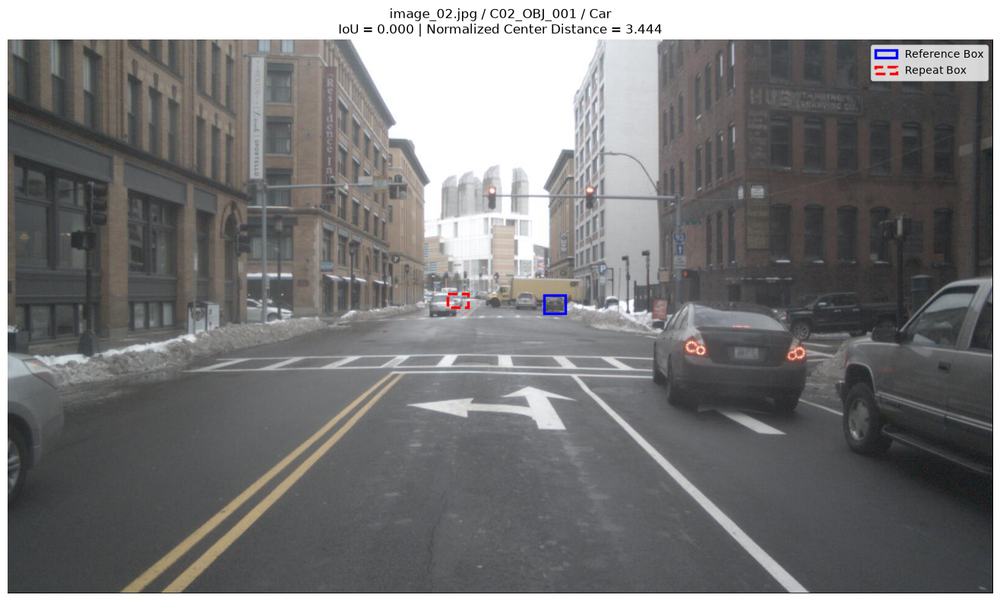

In [112]:
visualize_zero_iou_case(
    "image_02.jpg",
    "C02_OBJ_001"
)

#### EA-07-12. Case 2 Review Result(사례 2 검토 결과)

`image_02.jpg / C02_OBJ_001` Car(자동차) 사례를 Visual Inspection
(시각적 검토)한 결과, Reference Bounding Box(기준 바운딩 박스)와
Repeat Bounding Box(반복 바운딩 박스)는 서로 다른 차량을 가리키고 있었다.

따라서 본 사례의 Final Error Type(최종 오류 유형)은
**Object Matching Error(객체 매칭 오류)**로 분류하였다.

- IoU: 0.000
- Center Distance(중심점 거리): 157.393 Pixel(픽셀)
- Normalized Center Distance(정규화 중심점 거리): 3.444
- Same Object(동일 객체): No
- Final Error Type(최종 오류 유형): Object Matching Error
- Root Cause(원인): 동일 Class(클래스)의 여러 객체가 존재하는 상황에서
  Reference와 다른 차량을 Repeat Labeling(반복 라벨링) 대상으로 선택함

이 사례는 Small/Distant Object(소형/원거리 객체)가 여러 개 존재하는 장면에서
Class Agreement(클래스 일치)가 유지되더라도 Object Identity(객체 식별)가
달라질 수 있음을 보여준다.

In [113]:
# EA-07-12. Update Case 2 Visual Review Result

case_mask = (
    (visual_review_df["image_name"] == "image_02.jpg")
    & (visual_review_df["reference_object_id"] == "C02_OBJ_001")
)

visual_review_df.loc[case_mask, "same_object"] = "No"
visual_review_df.loc[case_mask, "final_error_type"] = "Object Matching Error"
visual_review_df.loc[case_mask, "review_note"] = (
    "Reference and repeat boxes indicate different cars."
)

display(visual_review_df)

,image_name,reference_object_id,reference_class,center_distance,normalized_center_distance,area_ratio,candidate_error_pattern,same_object,final_error_type,review_note
0,image_05.jpg,C05_OBJ_001,Pedestrian,955.310646,6.982270,1.185015,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
1,image_02.jpg,C02_OBJ_001,Car,157.392828,3.443807,0.740470,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
2,image_04.jpg,C04_OBJ_008,Traffic Cone,54.346366,3.190567,2.804779,Potential Object Mismatch,,,
3,image_07.jpg,C07_OBJ_003,Car,237.106903,2.957482,0.653728,Large Localization Shift,,,
4,image_06.jpg,C06_OBJ_001,Traffic Cone,57.010703,2.053297,1.073441,Large Localization Shift,,,
5,image_06.jpg,C06_OBJ_004,Traffic Cone,33.556072,1.145839,0.945746,Large Localization Shift,,,
6,image_08.jpg,C08_OBJ_005,Traffic Cone,7.918619,0.402548,0.806133,Moderate Localization Shift,,,


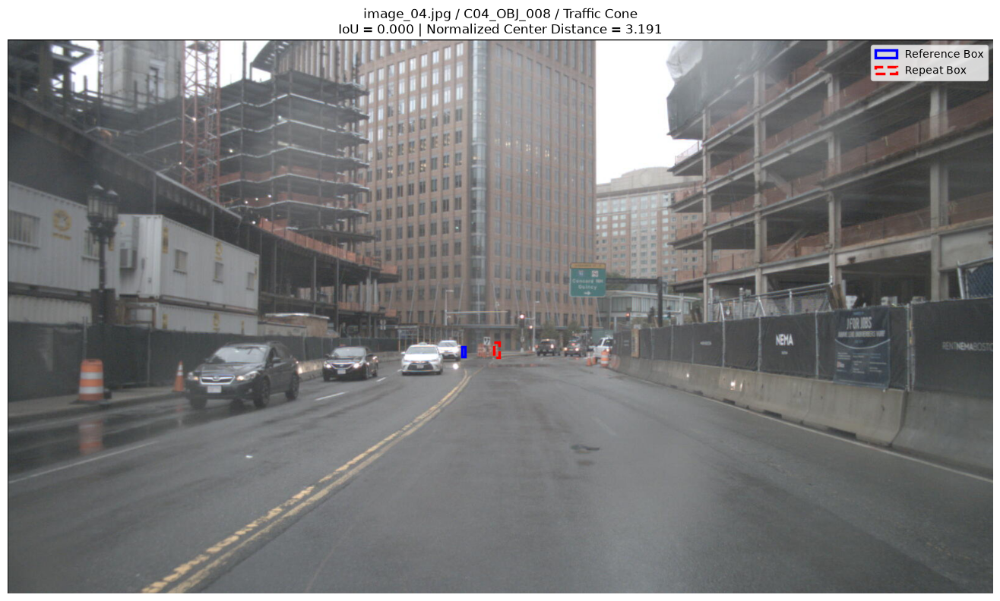

In [114]:
visualize_zero_iou_case(
    "image_04.jpg",
    "C04_OBJ_008"
)

#### EA-07-13. Case 3 Review Result(사례 3 검토 결과)

`image_04.jpg / C04_OBJ_008` Traffic Cone(트래픽 콘) 사례를
Visual Inspection(시각적 검토)한 결과, Reference Bounding Box
(기준 바운딩 박스)와 Repeat Bounding Box(반복 바운딩 박스)는
서로 다른 Traffic Cone을 가리키는 것으로 확인되었다.

따라서 본 사례의 Final Error Type(최종 오류 유형)은
**Object Matching Error(객체 매칭 오류)**로 분류하였다.

- IoU: 0.000
- Center Distance(중심점 거리): 54.346 Pixel(픽셀)
- Normalized Center Distance(정규화 중심점 거리): 3.191
- Area Ratio(면적 비율): 2.805
- Same Object(동일 객체): No
- Final Error Type(최종 오류 유형): Object Matching Error
- Root Cause(원인): 여러 Small/Distant Traffic Cone(소형/원거리 트래픽 콘)이
  인접한 장면에서 다른 객체를 Repeat Labeling(반복 라벨링) 대상으로 선택함

이 사례는 절대 Center Distance가 상대적으로 크지 않더라도
Small Object(소형 객체)에서는 객체 크기 대비 위치 차이가 크게 나타날 수 있으며,
Normalized Center Distance가 Object Matching Error 후보를 탐색하는
보조 지표로 활용될 수 있음을 보여준다.

In [115]:
# EA-07-13. Update Case 3 Visual Review Result

case_mask = (
    (visual_review_df["image_name"] == "image_04.jpg")
    & (visual_review_df["reference_object_id"] == "C04_OBJ_008")
)

visual_review_df.loc[case_mask, "same_object"] = "No"
visual_review_df.loc[case_mask, "final_error_type"] = "Object Matching Error"
visual_review_df.loc[case_mask, "review_note"] = (
    "Reference and repeat boxes indicate different traffic cones."
)

display(visual_review_df)

,image_name,reference_object_id,reference_class,center_distance,normalized_center_distance,area_ratio,candidate_error_pattern,same_object,final_error_type,review_note
0,image_05.jpg,C05_OBJ_001,Pedestrian,955.310646,6.982270,1.185015,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
1,image_02.jpg,C02_OBJ_001,Car,157.392828,3.443807,0.740470,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
2,image_04.jpg,C04_OBJ_008,Traffic Cone,54.346366,3.190567,2.804779,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
3,image_07.jpg,C07_OBJ_003,Car,237.106903,2.957482,0.653728,Large Localization Shift,,,
4,image_06.jpg,C06_OBJ_001,Traffic Cone,57.010703,2.053297,1.073441,Large Localization Shift,,,
5,image_06.jpg,C06_OBJ_004,Traffic Cone,33.556072,1.145839,0.945746,Large Localization Shift,,,
6,image_08.jpg,C08_OBJ_005,Traffic Cone,7.918619,0.402548,0.806133,Moderate Localization Shift,,,


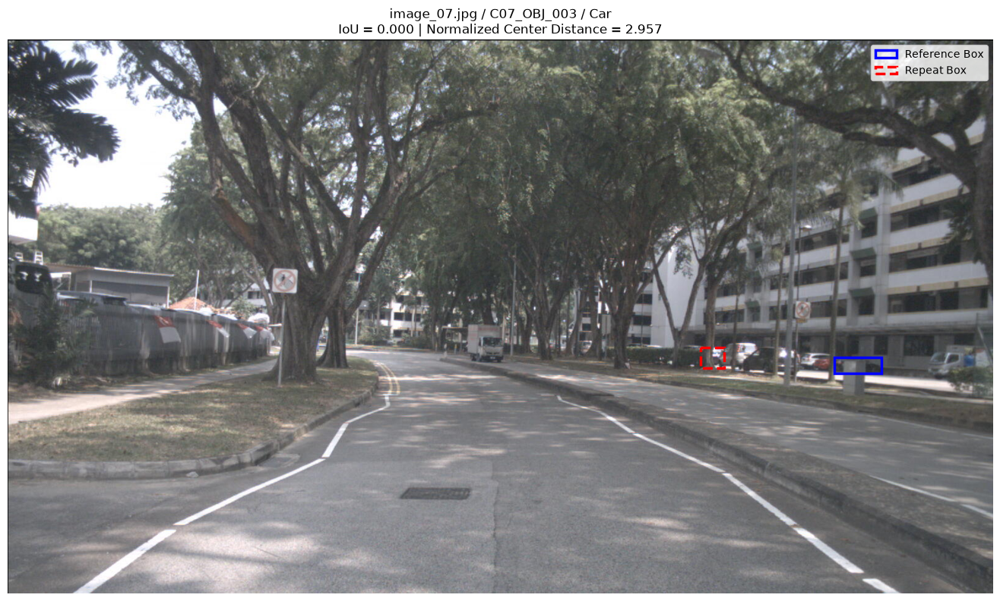

In [116]:
visualize_zero_iou_case(
    "image_07.jpg",
    "C07_OBJ_003"
)

#### EA-07-14. Case 4 Review Result(사례 4 검토 결과)

`image_07.jpg / C07_OBJ_003` Car(자동차) 사례를 Visual Inspection
(시각적 검토)한 결과, Reference Bounding Box(기준 바운딩 박스)와
Repeat Bounding Box(반복 바운딩 박스)는 서로 다른 차량을 가리키고 있었다.

따라서 Candidate Error Pattern(후보 오류 패턴)은
Large Localization Shift(큰 위치 이동)였지만,
Final Error Type(최종 오류 유형)은
**Object Matching Error(객체 매칭 오류)**로 분류하였다.

- IoU: 0.000
- Center Distance(중심점 거리): 237.107 Pixel(픽셀)
- Normalized Center Distance(정규화 중심점 거리): 2.957
- Area Ratio(면적 비율): 0.654
- Same Object(동일 객체): No
- Final Error Type(최종 오류 유형): Object Matching Error

본 사례는 Normalized Center Distance를 이용한 Candidate Classification이
Visual Review(시각적 검토) 대상을 선별하는 데는 유용하지만,
임의의 Threshold(임계값)만으로 Object Matching Error를 확정할 수 없음을 보여준다.

따라서 최종 오류 유형은 정량 지표와 Visual Inspection을 함께 사용하여
판단하는 것이 적절하다.

In [117]:
# EA-07-14. Update Case 4 Visual Review Result

case_mask = (
    (visual_review_df["image_name"] == "image_07.jpg")
    & (visual_review_df["reference_object_id"] == "C07_OBJ_003")
)

visual_review_df.loc[case_mask, "same_object"] = "No"
visual_review_df.loc[case_mask, "final_error_type"] = "Object Matching Error"
visual_review_df.loc[case_mask, "review_note"] = (
    "Reference and repeat boxes indicate different cars."
)

display(visual_review_df)

,image_name,reference_object_id,reference_class,center_distance,normalized_center_distance,area_ratio,candidate_error_pattern,same_object,final_error_type,review_note
0,image_05.jpg,C05_OBJ_001,Pedestrian,955.310646,6.982270,1.185015,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
1,image_02.jpg,C02_OBJ_001,Car,157.392828,3.443807,0.740470,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
2,image_04.jpg,C04_OBJ_008,Traffic Cone,54.346366,3.190567,2.804779,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
3,image_07.jpg,C07_OBJ_003,Car,237.106903,2.957482,0.653728,Large Localization Shift,No,Object Matching Error,Reference and repeat boxes indicate different ...
4,image_06.jpg,C06_OBJ_001,Traffic Cone,57.010703,2.053297,1.073441,Large Localization Shift,,,
5,image_06.jpg,C06_OBJ_004,Traffic Cone,33.556072,1.145839,0.945746,Large Localization Shift,,,
6,image_08.jpg,C08_OBJ_005,Traffic Cone,7.918619,0.402548,0.806133,Moderate Localization Shift,,,


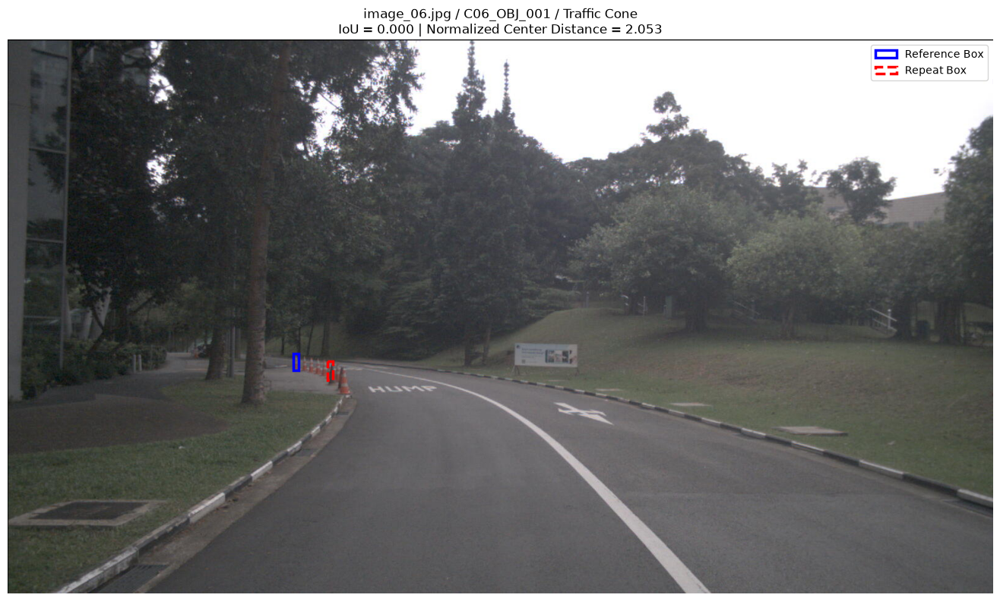

In [118]:
visualize_zero_iou_case(
    "image_06.jpg",
    "C06_OBJ_001"
)

#### EA-07-15. Case 5 Review Result(사례 5 검토 결과)

`image_06.jpg / C06_OBJ_001` Traffic Cone(트래픽 콘) 사례를
Visual Inspection(시각적 검토)한 결과, Reference Bounding Box
(기준 바운딩 박스)와 Repeat Bounding Box(반복 바운딩 박스)는
서로 다른 Traffic Cone을 가리키는 것으로 확인되었다.

따라서 Candidate Error Pattern(후보 오류 패턴)은
Large Localization Shift(큰 위치 이동)였지만,
Final Error Type(최종 오류 유형)은
**Object Matching Error(객체 매칭 오류)**로 분류하였다.

- IoU: 0.000
- Center Distance(중심점 거리): 57.011 Pixel(픽셀)
- Normalized Center Distance(정규화 중심점 거리): 2.053
- Area Ratio(면적 비율): 1.073
- Same Object(동일 객체): No
- Final Error Type(최종 오류 유형): Object Matching Error

Reference와 Repeat Bounding Box의 면적은 유사하지만 중심 위치가 크게 달랐으며,
Visual Inspection을 통해 서로 다른 객체가 선택된 것을 확인하였다.

이 사례는 유사한 크기의 Small/Distant Object(소형/원거리 객체)가
인접해 있을 경우 Bounding Box Size(바운딩 박스 크기)가 유사하더라도
Object Identity(객체 식별) 오류가 발생할 수 있음을 보여준다.

In [119]:
# EA-07-15. Update Case 5 Visual Review Result

case_mask = (
    (visual_review_df["image_name"] == "image_06.jpg")
    & (visual_review_df["reference_object_id"] == "C06_OBJ_001")
)

visual_review_df.loc[case_mask, "same_object"] = "No"
visual_review_df.loc[case_mask, "final_error_type"] = "Object Matching Error"
visual_review_df.loc[case_mask, "review_note"] = (
    "Reference and repeat boxes indicate different traffic cones."
)

display(visual_review_df)

,image_name,reference_object_id,reference_class,center_distance,normalized_center_distance,area_ratio,candidate_error_pattern,same_object,final_error_type,review_note
0,image_05.jpg,C05_OBJ_001,Pedestrian,955.310646,6.982270,1.185015,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
1,image_02.jpg,C02_OBJ_001,Car,157.392828,3.443807,0.740470,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
2,image_04.jpg,C04_OBJ_008,Traffic Cone,54.346366,3.190567,2.804779,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
3,image_07.jpg,C07_OBJ_003,Car,237.106903,2.957482,0.653728,Large Localization Shift,No,Object Matching Error,Reference and repeat boxes indicate different ...
4,image_06.jpg,C06_OBJ_001,Traffic Cone,57.010703,2.053297,1.073441,Large Localization Shift,No,Object Matching Error,Reference and repeat boxes indicate different ...
5,image_06.jpg,C06_OBJ_004,Traffic Cone,33.556072,1.145839,0.945746,Large Localization Shift,,,
6,image_08.jpg,C08_OBJ_005,Traffic Cone,7.918619,0.402548,0.806133,Moderate Localization Shift,,,


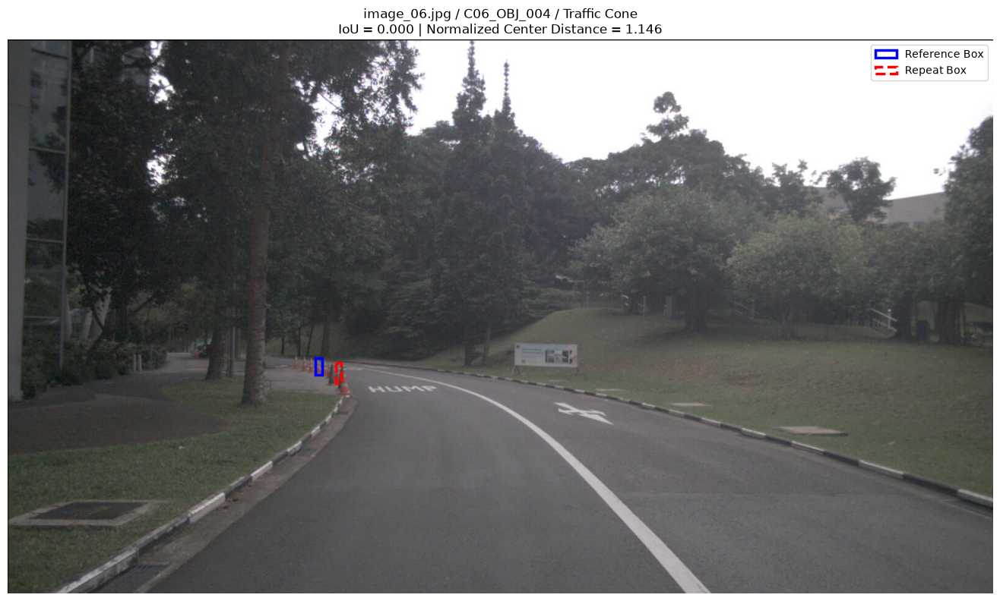

In [120]:
visualize_zero_iou_case(
    "image_06.jpg",
    "C06_OBJ_004"
)

#### EA-07-16. Case 6 Review Result(사례 6 검토 결과)

`image_06.jpg / C06_OBJ_004` Traffic Cone(트래픽 콘) 사례를
Visual Inspection(시각적 검토)한 결과, Reference Bounding Box
(기준 바운딩 박스)와 Repeat Bounding Box(반복 바운딩 박스)는
인접해 있지만 서로 다른 Traffic Cone을 가리키는 것으로 확인되었다.

따라서 Candidate Error Pattern(후보 오류 패턴)은
Large Localization Shift(큰 위치 이동)였지만,
Final Error Type(최종 오류 유형)은
**Object Matching Error(객체 매칭 오류)**로 분류하였다.

- IoU: 0.000
- Center Distance(중심점 거리): 33.556 Pixel(픽셀)
- Normalized Center Distance(정규화 중심점 거리): 1.146
- Area Ratio(면적 비율): 0.946
- Same Object(동일 객체): No
- Final Error Type(최종 오류 유형): Object Matching Error

본 사례에서는 Reference와 Repeat Bounding Box의 크기는 유사했지만
서로 다른 인접 Traffic Cone이 선택되었다.

이는 동일 Class(클래스)의 Small/Distant Object(소형/원거리 객체)가
연속적으로 배치된 장면에서 Object Identity(객체 식별)를 유지하는 것이
라벨링 일관성에 중요한 요소임을 보여준다.

In [121]:
# EA-07-16. Update Case 6 Visual Review Result

case_mask = (
    (visual_review_df["image_name"] == "image_06.jpg")
    & (visual_review_df["reference_object_id"] == "C06_OBJ_004")
)

visual_review_df.loc[case_mask, "same_object"] = "No"
visual_review_df.loc[case_mask, "final_error_type"] = "Object Matching Error"
visual_review_df.loc[case_mask, "review_note"] = (
    "Reference and repeat boxes indicate different adjacent traffic cones."
)

display(visual_review_df)

,image_name,reference_object_id,reference_class,center_distance,normalized_center_distance,area_ratio,candidate_error_pattern,same_object,final_error_type,review_note
0,image_05.jpg,C05_OBJ_001,Pedestrian,955.310646,6.982270,1.185015,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
1,image_02.jpg,C02_OBJ_001,Car,157.392828,3.443807,0.740470,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
2,image_04.jpg,C04_OBJ_008,Traffic Cone,54.346366,3.190567,2.804779,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
3,image_07.jpg,C07_OBJ_003,Car,237.106903,2.957482,0.653728,Large Localization Shift,No,Object Matching Error,Reference and repeat boxes indicate different ...
4,image_06.jpg,C06_OBJ_001,Traffic Cone,57.010703,2.053297,1.073441,Large Localization Shift,No,Object Matching Error,Reference and repeat boxes indicate different ...
5,image_06.jpg,C06_OBJ_004,Traffic Cone,33.556072,1.145839,0.945746,Large Localization Shift,No,Object Matching Error,Reference and repeat boxes indicate different ...
6,image_08.jpg,C08_OBJ_005,Traffic Cone,7.918619,0.402548,0.806133,Moderate Localization Shift,,,


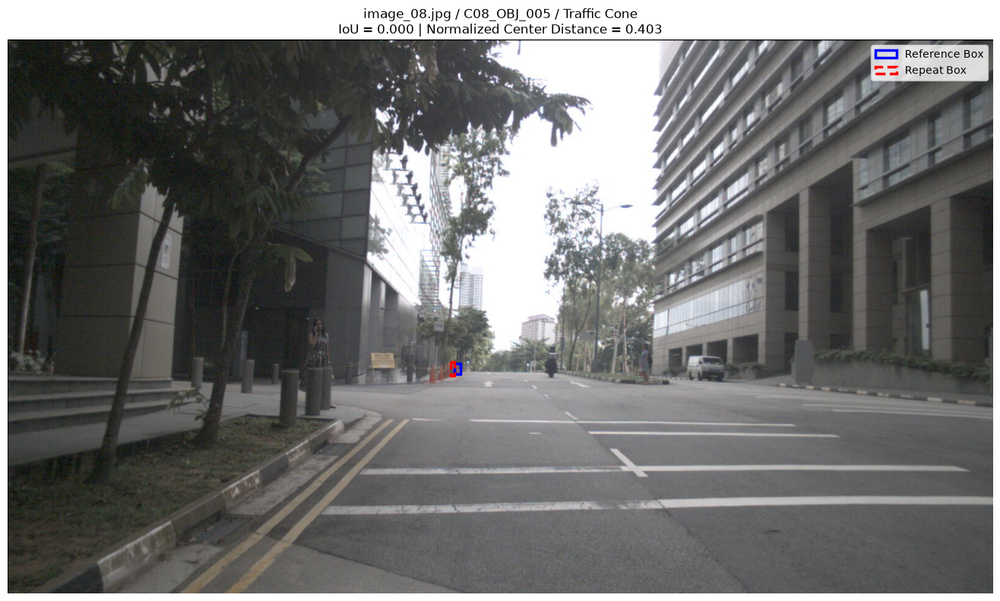

In [122]:
visualize_zero_iou_case(
    "image_08.jpg",
    "C08_OBJ_005"
)

#### EA-07-17. Case 7 Review Result(사례 7 검토 결과)

`image_08.jpg / C08_OBJ_005` Traffic Cone(트래픽 콘) 사례를
Visual Inspection(시각적 검토)한 결과, Reference Bounding Box
(기준 바운딩 박스)와 Repeat Bounding Box(반복 바운딩 박스)는
동일한 Traffic Cone을 대상으로 한 것으로 판단하였다.

그러나 대상 객체가 매우 작은 Small Object(소형 객체)이므로
비교적 작은 Pixel-level Localization Difference(픽셀 수준 위치 차이)에도
두 Bounding Box의 겹침이 발생하지 않아 IoU가 0으로 나타났다.

따라서 본 사례의 Final Error Type(최종 오류 유형)은
**Small Object Localization Error(소형 객체 위치 오류)**로 분류하였다.

- IoU: 0.000
- Center Distance(중심점 거리): 7.919 Pixel(픽셀)
- Normalized Center Distance(정규화 중심점 거리): 0.403
- Area Ratio(면적 비율): 0.806
- Same Object(동일 객체): Yes
- Final Error Type(최종 오류 유형): Small Object Localization Error

본 사례는 Small Object에서 절대적인 Pixel Difference가 작더라도
객체 크기 대비 상대적인 위치 차이가 커질 수 있으며,
IoU가 이러한 작은 위치 변화에 민감하게 반응할 수 있음을 보여준다.

In [123]:
# EA-07-17. Update Case 7 Visual Review Result

case_mask = (
    (visual_review_df["image_name"] == "image_08.jpg")
    & (visual_review_df["reference_object_id"] == "C08_OBJ_005")
)

visual_review_df.loc[case_mask, "same_object"] = "Yes"
visual_review_df.loc[
    case_mask,
    "final_error_type"
] = "Small Object Localization Error"

visual_review_df.loc[case_mask, "review_note"] = (
    "Same traffic cone; small positional difference resulted in zero overlap."
)

display(visual_review_df)

,image_name,reference_object_id,reference_class,center_distance,normalized_center_distance,area_ratio,candidate_error_pattern,same_object,final_error_type,review_note
0,image_05.jpg,C05_OBJ_001,Pedestrian,955.310646,6.982270,1.185015,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
1,image_02.jpg,C02_OBJ_001,Car,157.392828,3.443807,0.740470,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
2,image_04.jpg,C04_OBJ_008,Traffic Cone,54.346366,3.190567,2.804779,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
3,image_07.jpg,C07_OBJ_003,Car,237.106903,2.957482,0.653728,Large Localization Shift,No,Object Matching Error,Reference and repeat boxes indicate different ...
4,image_06.jpg,C06_OBJ_001,Traffic Cone,57.010703,2.053297,1.073441,Large Localization Shift,No,Object Matching Error,Reference and repeat boxes indicate different ...
5,image_06.jpg,C06_OBJ_004,Traffic Cone,33.556072,1.145839,0.945746,Large Localization Shift,No,Object Matching Error,Reference and repeat boxes indicate different ...
6,image_08.jpg,C08_OBJ_005,Traffic Cone,7.918619,0.402548,0.806133,Moderate Localization Shift,Yes,Small Object Localization Error,Same traffic cone; small positional difference...


In [124]:
# EA-07-18. Final Error Type Summary

final_error_summary = (
    visual_review_df["final_error_type"]
    .value_counts()
    .rename_axis("final_error_type")
    .reset_index(name="count")
)

final_error_summary["percentage"] = (
    final_error_summary["count"]
    / len(visual_review_df)
    * 100
).round(1)

print("=== Final Error Type Distribution ===")
display(final_error_summary)

print("\n=== Same Object Review ===")
print(
    visual_review_df["same_object"]
    .value_counts()
)

print("\n=== Final Visual Review Table ===")
display(visual_review_df)

=== Final Error Type Distribution ===


,final_error_type,count,percentage
0,Object Matching Error,6,85.7
1,Small Object Localization Error,1,14.3



=== Same Object Review ===
same_object
No     6
Yes    1
Name: count, dtype: int64

=== Final Visual Review Table ===


,image_name,reference_object_id,reference_class,center_distance,normalized_center_distance,area_ratio,candidate_error_pattern,same_object,final_error_type,review_note
0,image_05.jpg,C05_OBJ_001,Pedestrian,955.310646,6.982270,1.185015,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
1,image_02.jpg,C02_OBJ_001,Car,157.392828,3.443807,0.740470,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
2,image_04.jpg,C04_OBJ_008,Traffic Cone,54.346366,3.190567,2.804779,Potential Object Mismatch,No,Object Matching Error,Reference and repeat boxes indicate different ...
3,image_07.jpg,C07_OBJ_003,Car,237.106903,2.957482,0.653728,Large Localization Shift,No,Object Matching Error,Reference and repeat boxes indicate different ...
4,image_06.jpg,C06_OBJ_001,Traffic Cone,57.010703,2.053297,1.073441,Large Localization Shift,No,Object Matching Error,Reference and repeat boxes indicate different ...
5,image_06.jpg,C06_OBJ_004,Traffic Cone,33.556072,1.145839,0.945746,Large Localization Shift,No,Object Matching Error,Reference and repeat boxes indicate different ...
6,image_08.jpg,C08_OBJ_005,Traffic Cone,7.918619,0.402548,0.806133,Moderate Localization Shift,Yes,Small Object Localization Error,Same traffic cone; small positional difference...


#### EA-07-19. Bounding Box Error Pattern Summary(바운딩 박스 오류 패턴 요약)

Zero-IoU 7개 사례에 대해 Bounding Box Error Metric(바운딩 박스 오류 지표)과
Visual Inspection(시각적 검토)을 결합하여 오류 유형을 분석하였다.

### 주요 결과

- Zero-IoU 7건 중 6건(85.7%)은 Object Matching Error(객체 매칭 오류)로
  확인되었다.
- 나머지 1건(14.3%)은 동일한 Small Object(소형 객체)를 라벨링했지만
  작은 위치 차이로 Bounding Box가 겹치지 않은
  Small Object Localization Error(소형 객체 위치 오류)였다.
- Object Matching Error는 Car(자동차), Pedestrian(보행자),
  Traffic Cone(트래픽 콘) 등 여러 Class(클래스)에서 나타났다.
- 특히 동일 Class의 객체가 여러 개 존재하거나 Small/Distant Object
  (소형/원거리 객체)가 인접한 장면에서 Object Identity(객체 식별)가
  달라지는 사례가 확인되었다.

### Normalized Center Distance(정규화 중심점 거리)

절대 Center Distance(중심점 거리)를 Reference Bounding Box Size
(기준 바운딩 박스 크기)로 정규화한 결과, Non-zero IoU 객체는
0.004~0.082, Zero-IoU 객체는 0.403~6.982 범위에 분포하였다.

본 Pilot Sample(파일럿 표본)에서는 두 그룹이 분리되는 패턴이 관찰되었지만,
이를 일반적인 Quality Threshold(품질 임계값)로 해석하지 않는다.

또한 Candidate Classification(후보 분류)에서 Large Localization Shift로
분류된 일부 사례가 Visual Inspection 결과 Object Matching Error로 확인되었다.
따라서 Normalized Center Distance는 오류 후보를 탐색하는 보조 지표로는
유용하지만 Final Error Type(최종 오류 유형)을 단독으로 결정하기에는
충분하지 않았다.

### Key Finding(핵심 발견)

이번 Repeat Labeling(반복 라벨링)에서 발생한 주요 Zero-IoU 문제는
Bounding Box Precision(바운딩 박스 정밀도)보다
Object Matching Consistency(객체 매칭 일관성)와 더 밀접하게 관련되어 있었다.

따라서 향후 Labeling Guideline(라벨링 가이드라인)에서는 동일 Class의 객체가
여러 개 존재하는 장면에서 Target Object Identification(대상 객체 식별)과
Object Matching Rule(객체 매칭 규칙)을 보다 명확하게 정의할 필요가 있다.

Small Object의 경우에는 몇 Pixel 수준의 위치 차이도 IoU에 큰 영향을
줄 수 있으므로, Zoom-based Review(확대 기반 검토)와 Small Object 전용
QA Rule(품질 검수 규칙)을 함께 적용하는 것이 필요하다.

본 분석은 16개 Repeat Labeling 객체 중 Zero-IoU 7건을 대상으로 수행한
Exploratory Error Analysis(탐색적 오류 분석)이며,
전체 데이터셋에 대한 통계적 일반화를 목적으로 하지 않는다.

### EA-08. Root Cause Analysis(근본 원인 분석)

Visual Inspection(시각적 검토)을 통해 확정한 Final Error Type(최종 오류 유형)을
기반으로 오류 발생의 Root Cause(근본 원인)를 분석한다.

앞선 분석에서 Zero-IoU 7건 중 6건(85.7%)은
Object Matching Error(객체 매칭 오류), 1건(14.3%)은
Small Object Localization Error(소형 객체 위치 오류)로 확인되었다.

본 단계에서는 Final Error Type을 Class(클래스) 및 Difficulty Attribute
(난이도 속성)와 연결하여 반복적으로 나타나는 오류 조건을 확인한다.

분석 목적은 다음과 같다.

- 오류가 특정 Class에 집중되는지 확인
- Small/Distant(소형/원거리), Occlusion(가림),
  Ambiguity(모호성) 등의 Attribute와 오류 사례를 연결
- Object Matching Error가 발생하기 쉬운 장면 특성을 파악
- Labeling Guideline(라벨링 가이드라인) 및 QA Rule(품질 검수 규칙)
  개선 방향을 도출

본 분석은 제한된 Pilot Sample(파일럿 표본)을 대상으로 한
Exploratory Root Cause Analysis(탐색적 근본 원인 분석)이다.

In [125]:
# EA-08-1. Build Root Cause Analysis Dataset

root_cause_df = visual_review_df.merge(
    analysis_df[
        [
            "image_name",
            "reference_object_id",
            "occlusion",
            "truncation",
            "small_distant",
            "ambiguity"
        ]
    ],
    on=["image_name", "reference_object_id"],
    how="left"
)

print("=== Root Cause Analysis Dataset ===")
print(f"Shape: {root_cause_df.shape}")

display(
    root_cause_df[
        [
            "image_name",
            "reference_object_id",
            "reference_class",
            "final_error_type",
            "occlusion",
            "truncation",
            "small_distant",
            "ambiguity",
            "normalized_center_distance"
        ]
    ]
)

=== Root Cause Analysis Dataset ===
Shape: (7, 14)


,image_name,reference_object_id,reference_class,final_error_type,occlusion,truncation,small_distant,ambiguity,normalized_center_distance
0,image_05.jpg,C05_OBJ_001,Pedestrian,Object Matching Error,Partial,None,False,None,6.982270
1,image_02.jpg,C02_OBJ_001,Car,Object Matching Error,Partial,None,True,None,3.443807
2,image_04.jpg,C04_OBJ_008,Traffic Cone,Object Matching Error,None,None,True,None,3.190567
3,image_07.jpg,C07_OBJ_003,Car,Object Matching Error,Heavy,None,True,Boundary,2.957482
4,image_06.jpg,C06_OBJ_001,Traffic Cone,Object Matching Error,Heavy,None,True,Boundary,2.053297
5,image_06.jpg,C06_OBJ_004,Traffic Cone,Object Matching Error,Partial,None,True,Boundary,1.145839
6,image_08.jpg,C08_OBJ_005,Traffic Cone,Small Object Localization Error,Partial,None,False,Boundary,0.402548


#### EA-08-2. Error Type by Class(클래스별 오류 유형)

Final Error Type(최종 오류 유형)을 Class(클래스)별로 집계하여
특정 객체 유형에 오류가 집중되는지 확인한다.

특히 동일 Class의 객체가 반복적으로 등장하는 장면에서
Object Matching Error(객체 매칭 오류)가 발생하는지 살펴본다.

In [126]:
# EA-08-2. Analyze Final Error Type by Class

error_class_summary = (
    root_cause_df
    .groupby(["final_error_type", "reference_class"])
    .size()
    .reset_index(name="count")
    .sort_values(
        ["final_error_type", "count"],
        ascending=[True, False]
    )
)

print("=== Final Error Type by Class ===")
display(error_class_summary)

=== Final Error Type by Class ===


,final_error_type,reference_class,count
2,Object Matching Error,Traffic Cone,3
0,Object Matching Error,Car,2
1,Object Matching Error,Pedestrian,1
3,Small Object Localization Error,Traffic Cone,1


#### EA-08-3. Error Type by Difficulty Attribute(난이도 속성별 오류 유형)

Final Error Type(최종 오류 유형)과 Difficulty Attribute(난이도 속성)의
관계를 분석하여 오류가 특정 객체 조건에서 반복적으로 발생하는지 확인한다.

Occlusion(가림), Truncation(잘림), Small/Distant(소형/원거리),
Ambiguity(모호성)를 각각 비교한다.

단, 본 분석은 Zero-IoU 7건만을 대상으로 하므로 Attribute와 오류 간의
통계적 인과관계를 검증하기보다는 반복적으로 나타나는 Error Pattern
(오류 패턴)을 탐색하는 것을 목적으로 한다.

In [127]:
# EA-08-3. Analyze Error Types by Difficulty Attributes

attribute_columns = [
    "occlusion",
    "truncation",
    "small_distant",
    "ambiguity"
]

attribute_summaries = []

for attribute in attribute_columns:
    summary = (
        root_cause_df
        .groupby(["final_error_type", attribute])
        .size()
        .reset_index(name="count")
    )

    summary.insert(0, "attribute", attribute)
    summary = summary.rename(columns={attribute: "attribute_value"})

    attribute_summaries.append(summary)

error_attribute_summary = pd.concat(
    attribute_summaries,
    ignore_index=True
)

print("=== Final Error Type by Difficulty Attribute ===")
display(error_attribute_summary)

=== Final Error Type by Difficulty Attribute ===


,attribute,final_error_type,attribute_value,count
0,occlusion,Object Matching Error,Heavy,2
1,occlusion,Object Matching Error,None,1
2,occlusion,Object Matching Error,Partial,3
3,occlusion,Small Object Localization Error,Partial,1
4,truncation,Object Matching Error,None,6
5,truncation,Small Object Localization Error,None,1
6,small_distant,Object Matching Error,False,1
7,small_distant,Object Matching Error,True,5
8,small_distant,Small Object Localization Error,False,1
9,ambiguity,Object Matching Error,Boundary,3


#### EA-08-4. Object Matching Error Attribute Profile(객체 매칭 오류 속성 프로파일)

Object Matching Error(객체 매칭 오류) 6건을 대상으로
Difficulty Attribute(난이도 속성)의 분포를 확인한다.

이를 통해 반복 라벨링 과정에서 객체 식별을 어렵게 만든
Scene Condition(장면 조건)의 후보를 탐색한다.

In [128]:
# EA-08-4. Object Matching Error Attribute Profile

matching_errors = root_cause_df[
    root_cause_df["final_error_type"] == "Object Matching Error"
].copy()

print("=== Object Matching Error Cases ===")
print(f"Total Cases: {len(matching_errors)}")

print("\n=== Small/Distant ===")
print(
    matching_errors["small_distant"]
    .value_counts(dropna=False)
)

print("\n=== Occlusion ===")
print(
    matching_errors["occlusion"]
    .value_counts(dropna=False)
)

print("\n=== Ambiguity ===")
print(
    matching_errors["ambiguity"]
    .value_counts(dropna=False)
)

print("\n=== Truncation ===")
print(
    matching_errors["truncation"]
    .value_counts(dropna=False)
)

=== Object Matching Error Cases ===
Total Cases: 6

=== Small/Distant ===
small_distant
True     5
False    1
Name: count, dtype: int64

=== Occlusion ===
occlusion
Partial    3
Heavy      2
None       1
Name: count, dtype: int64

=== Ambiguity ===
ambiguity
None        3
Boundary    3
Name: count, dtype: int64

=== Truncation ===
truncation
None    6
Name: count, dtype: int64


#### EA-08-5. Attribute Error Rate(속성별 오류율)

Object Matching Error(객체 매칭 오류) 사례에서 특정 Difficulty Attribute
(난이도 속성)가 자주 나타나는 것을 확인하였다.

그러나 오류 사례의 빈도만으로는 해당 Attribute가 오류 발생과 관련되어
있는지 판단하기 어렵다. 따라서 전체 16개 Repeat Sample(반복 라벨링 표본)을
기준으로 각 Attribute 조건별 Zero-IoU Error Rate(오류율)를 비교한다.

Error Rate는 다음과 같이 계산한다.

**Error Rate = Zero-IoU Object 수 / 해당 Attribute의 전체 Object 수 × 100**

본 분석은 16개 객체의 Pilot Sample(파일럿 표본)을 대상으로 하므로,
결과는 통계적 인과관계가 아닌 Exploratory Pattern(탐색적 패턴)으로 해석한다.

In [129]:
# EA-08-5A. Create Zero-IoU Error Flag

attribute_error_df = analysis_df.copy()

attribute_error_df["zero_iou_error"] = (
    attribute_error_df["iou"] == 0
)

print("=== Attribute Error Analysis Dataset ===")
print(f"Total Objects: {len(attribute_error_df)}")
print(
    f"Zero-IoU Objects: "
    f"{attribute_error_df['zero_iou_error'].sum()}"
)

display(
    attribute_error_df[
        [
            "image_name",
            "reference_object_id",
            "reference_class",
            "iou",
            "zero_iou_error",
            "occlusion",
            "truncation",
            "small_distant",
            "ambiguity"
        ]
    ].head()
)

=== Attribute Error Analysis Dataset ===
Total Objects: 16
Zero-IoU Objects: 7


,image_name,reference_object_id,reference_class,iou,zero_iou_error,occlusion,truncation,small_distant,ambiguity
0,image_01.jpg,C01_OBJ_002,Barrier,0.902978,False,Partial,Partial,False,None
1,image_01.jpg,C01_OBJ_007,Construction Vehicle,0.919665,False,Partial,None,False,None
2,image_02.jpg,C02_OBJ_001,Car,0.000000,True,Partial,None,True,None
3,image_02.jpg,C02_OBJ_004,Car,0.954900,False,None,Heavy,False,None
4,image_03.jpg,C03_OBJ_002,Car,0.816890,False,Heavy,None,True,Class


In [130]:
# EA-08-5B. Zero-IoU Error Rate by Small/Distant

small_distant_error = (
    attribute_error_df
    .groupby("small_distant")
    .agg(
        sample_size=("zero_iou_error", "size"),
        zero_iou_count=("zero_iou_error", "sum")
    )
    .reset_index()
)

small_distant_error["zero_iou_rate"] = (
    small_distant_error["zero_iou_count"]
    / small_distant_error["sample_size"]
    * 100
).round(1)

print("=== Zero-IoU Error Rate by Small/Distant ===")
display(small_distant_error)

=== Zero-IoU Error Rate by Small/Distant ===


,small_distant,sample_size,zero_iou_count,zero_iou_rate
0,False,6,2,33.3
1,True,10,5,50.0


In [131]:
# EA-08-5C. Zero-IoU Error Rate by Occlusion

occlusion_error = (
    attribute_error_df
    .groupby("occlusion")
    .agg(
        sample_size=("zero_iou_error", "size"),
        zero_iou_count=("zero_iou_error", "sum")
    )
    .reset_index()
)

occlusion_error["zero_iou_rate"] = (
    occlusion_error["zero_iou_count"]
    / occlusion_error["sample_size"]
    * 100
).round(1)

print("=== Zero-IoU Error Rate by Occlusion ===")
display(occlusion_error)

=== Zero-IoU Error Rate by Occlusion ===


,occlusion,sample_size,zero_iou_count,zero_iou_rate
0,Heavy,4,2,50.0
1,None,3,1,33.3
2,Partial,9,4,44.4


#### EA-08-6. Ambiguity and Truncation Error Rate(모호성 및 잘림 오류율)

Small/Distant(소형/원거리)와 Occlusion(가림)에 이어
Ambiguity(모호성)와 Truncation(잘림)의 Zero-IoU Error Rate
(오류율)를 계산한다.

각 Attribute의 전체 Sample Size(표본 수)를 분모로 사용하여
단순 오류 건수가 아닌 조건별 오류 발생 비율을 비교한다.

In [132]:
# EA-08-6. Zero-IoU Error Rate by Ambiguity and Truncation

def calculate_error_rate(df, attribute):

    summary = (
        df.groupby(attribute)
        .agg(
            sample_size=("zero_iou_error", "size"),
            zero_iou_count=("zero_iou_error", "sum")
        )
        .reset_index()
    )

    summary["zero_iou_rate"] = (
        summary["zero_iou_count"]
        / summary["sample_size"]
        * 100
    ).round(1)

    return summary


ambiguity_error = calculate_error_rate(
    attribute_error_df,
    "ambiguity"
)

truncation_error = calculate_error_rate(
    attribute_error_df,
    "truncation"
)

print("=== Zero-IoU Error Rate by Ambiguity ===")
display(ambiguity_error)

print("\n=== Zero-IoU Error Rate by Truncation ===")
display(truncation_error)

=== Zero-IoU Error Rate by Ambiguity ===


,ambiguity,sample_size,zero_iou_count,zero_iou_rate
0,Boundary,6,4,66.7
1,Class,4,0,0.0
2,None,6,3,50.0



=== Zero-IoU Error Rate by Truncation ===


,truncation,sample_size,zero_iou_count,zero_iou_rate
0,Heavy,1,0,0.0
1,None,13,7,53.8
2,Partial,2,0,0.0


#### EA-08-7. Attribute Error Rate Summary(속성별 오류율 요약)

각 Difficulty Attribute(난이도 속성)의 조건별 Zero-IoU Error Rate
(오류율)를 하나의 Summary Table(요약표)로 통합한다.

이를 통해 특정 Attribute 자체를 오류 원인으로 단정하기보다,
어떤 조건에서 라벨링 일관성 저하가 상대적으로 많이 관찰되었는지 비교한다.

In [133]:
# EA-08-7. Combine Attribute Error Rate Results

def format_attribute_summary(summary_df, attribute, value_column):
    result = summary_df[
        [value_column, "sample_size", "zero_iou_count", "zero_iou_rate"]
    ].copy()

    result.insert(0, "attribute", attribute)

    result = result.rename(
        columns={value_column: "attribute_value"}
    )

    return result


attribute_error_summary = pd.concat(
    [
        format_attribute_summary(
            small_distant_error,
            "Small/Distant",
            "small_distant"
        ),
        format_attribute_summary(
            occlusion_error,
            "Occlusion",
            "occlusion"
        ),
        format_attribute_summary(
            ambiguity_error,
            "Ambiguity",
            "ambiguity"
        ),
        format_attribute_summary(
            truncation_error,
            "Truncation",
            "truncation"
        )
    ],
    ignore_index=True
)

print("=== Attribute Error Rate Summary ===")
display(attribute_error_summary)

=== Attribute Error Rate Summary ===


,attribute,attribute_value,sample_size,zero_iou_count,zero_iou_rate
0,Small/Distant,False,6,2,33.3
1,Small/Distant,True,10,5,50.0
2,Occlusion,Heavy,4,2,50.0
3,Occlusion,None,3,1,33.3
4,Occlusion,Partial,9,4,44.4
5,Ambiguity,Boundary,6,4,66.7
6,Ambiguity,Class,4,0,0.0
7,Ambiguity,None,6,3,50.0
8,Truncation,Heavy,1,0,0.0
9,Truncation,None,13,7,53.8


#### EA-08-8. Root Cause Evidence Matrix(근본 원인 근거 매트릭스)

Attribute Error Rate(속성별 오류율)와 Visual Inspection(시각적 검토)
결과를 결합하여 주요 Root Cause Candidate(근본 원인 후보)를 정리한다.

각 요인은 오류의 직접적인 원인으로 단정하지 않고,
현재 Pilot Sample(파일럿 표본)에서 관찰된 Evidence(근거)를 기반으로
오류 발생 가능성을 높이는 Risk Factor(위험 요인) 또는
Process Issue(프로세스 문제)로 구분한다.

In [134]:
# EA-08-8. Create Root Cause Evidence Matrix

root_cause_matrix = pd.DataFrame({
    "root_cause_candidate": [
        "Object Identity Confusion",
        "Small/Distant Object",
        "Occlusion",
        "Boundary Ambiguity",
        "Truncation"
    ],
    "evidence": [
        "6 of 7 Zero-IoU cases were confirmed as Object Matching Errors",
        "5 of 6 Object Matching Errors were Small/Distant; Zero-IoU rate 50.0%",
        "5 of 6 Object Matching Errors had Partial or Heavy Occlusion",
        "Boundary cases showed 66.7% Zero-IoU rate",
        "All 7 Zero-IoU cases had no truncation"
    ],
    "interpretation": [
        "Primary process-level issue",
        "Potential object identification risk factor",
        "Potential visibility-related risk factor",
        "Potential boundary-related risk factor",
        "Not supported as a major risk factor in this sample"
    ]
})

print("=== Root Cause Evidence Matrix ===")
display(root_cause_matrix)

=== Root Cause Evidence Matrix ===


,root_cause_candidate,evidence,interpretation
0,Object Identity Confusion,6 of 7 Zero-IoU cases were confirmed as Object...,Primary process-level issue
1,Small/Distant Object,5 of 6 Object Matching Errors were Small/Dista...,Potential object identification risk factor
2,Occlusion,5 of 6 Object Matching Errors had Partial or H...,Potential visibility-related risk factor
3,Boundary Ambiguity,Boundary cases showed 66.7% Zero-IoU rate,Potential boundary-related risk factor
4,Truncation,All 7 Zero-IoU cases had no truncation,Not supported as a major risk factor in this s...


#### EA-08-9. Root Cause Analysis Summary(근본 원인 분석 요약)

Zero-IoU Error(Zero-IoU 오류)의 발생 원인을 파악하기 위해
Visual Inspection(시각적 검토) 결과와 Difficulty Attribute(난이도 속성)를
결합하여 Exploratory Root Cause Analysis(탐색적 근본 원인 분석)를 수행하였다.

### 주요 분석 결과

Zero-IoU 7건 중 6건(85.7%)이 Object Matching Error(객체 매칭 오류)로
확인되었으며, 동일 Class(클래스)의 다른 객체를 선택하는
Object Identity Confusion(객체 식별 혼동)이 주요 Process-level Issue
(프로세스 수준 문제)로 관찰되었다.

Object Matching Error 6건의 Attribute Profile(속성 프로파일)을 분석한 결과:

- 5건(83.3%)이 Small/Distant Object(소형/원거리 객체)였다.
- 5건(83.3%)에서 Partial 또는 Heavy Occlusion(부분 또는 심한 가림)이 존재했다.
- 3건(50.0%)에서 Boundary Ambiguity(경계 모호성)가 존재했다.
- 6건 모두 Truncation(잘림)은 존재하지 않았다.

전체 16개 Repeat Sample(반복 라벨링 표본)을 기준으로 Zero-IoU Error Rate
(오류율)를 비교한 결과:

- Small/Distant=True: 50.0%
- Small/Distant=False: 33.3%
- Heavy Occlusion: 50.0%
- Partial Occlusion: 44.4%
- No Occlusion: 33.3%
- Boundary Ambiguity: 66.7%
- Class Ambiguity: 0.0%
- No Ambiguity: 50.0%

이 결과는 Small/Distant(소형/원거리), Occlusion(가림),
Boundary Ambiguity(경계 모호성)가 Object Identification(객체 식별)을
어렵게 만드는 Risk Factor(위험 요인) 후보일 가능성을 보여준다.

반면 Truncation(잘림)은 Zero-IoU 사례 7건 모두에서 존재하지 않았으며,
현재 Pilot Sample(파일럿 표본)에서는 주요 Risk Factor라는 근거가
확인되지 않았다.

### Root Cause Structure(근본 원인 구조)

이번 분석에서 관찰된 오류 구조는 다음과 같이 정리할 수 있다.

**Scene Difficulty(장면 난이도)**  
Small/Distant + Occlusion + Boundary Ambiguity  
↓  
**Object Identification Difficulty(객체 식별 난이도 증가)**  
↓  
**Object Identity Confusion(객체 식별 혼동)**  
↓  
**Object Matching Error(객체 매칭 오류)**  
↓  
**Zero-IoU**

따라서 단순한 Bounding Box Precision(바운딩 박스 정밀도) 개선만으로는
주요 오류를 충분히 줄이기 어려우며, 동일 Class의 객체가 여러 개 존재하는
장면에서 Target Object Identification(대상 객체 식별)을 유지하는
Labeling Process(라벨링 프로세스)의 개선이 필요하다.

### Limitation(한계)

본 분석은 16개의 Repeat Labeling Sample(반복 라벨링 표본)과
7개의 Zero-IoU 사례를 대상으로 한 Exploratory Analysis(탐색적 분석)이다.

각 Attribute는 하나의 객체에 동시에 존재할 수 있으며 Sample Size(표본 수)가
작기 때문에, 개별 Attribute와 오류 발생 사이의 통계적 인과관계 또는
상대적 영향력을 확정할 수 없다.

따라서 본 결과는 향후 Labeling Guideline(라벨링 가이드라인)과
QA Rule(품질 검수 규칙)을 개선하기 위한 Risk Signal(위험 신호)로 활용한다.

### EA-09. Improvement Action Plan(개선 실행 계획)

Root Cause Analysis(근본 원인 분석)에서 확인된 Error Pattern(오류 패턴)을
기반으로 Labeling Quality(라벨링 품질)를 개선하기 위한 실행 방안을 수립한다.

Zero-IoU 사례의 주요 Process-level Issue(프로세스 수준 문제)는
Object Identity Confusion(객체 식별 혼동)이었으며,
Small/Distant Object(소형/원거리 객체), Occlusion(가림),
Boundary Ambiguity(경계 모호성)가 객체 식별을 어렵게 만드는
Risk Factor(위험 요인) 후보로 관찰되었다.

따라서 개선 방향을 다음 세 영역으로 구분한다.

1. Labeling Guideline Improvement(라벨링 가이드라인 개선)
2. QA Rule Improvement(품질 검수 규칙 개선)
3. Review Priority(검토 우선순위) 설정

본 단계에서는 Error Analysis(오류 분석) 결과를 실제 라벨링 프로세스의
재발 방지 및 품질 관리 방안으로 연결하는 것을 목적으로 한다.

#### EA-09-1. Object Matching Guideline Improvement(객체 매칭 가이드라인 개선)

Object Matching Error(객체 매칭 오류) 재발을 줄이기 위해
Target Object Identification Rule(대상 객체 식별 규칙)을 강화한다.

### Proposed Rule(제안 규칙)

**Rule 1. 동일 Class의 객체가 여러 개 존재할 경우 위치 관계를 먼저 확인한다.**

라벨링 대상과 동일한 Class(클래스)의 객체가 여러 개 존재하는 경우,
Bounding Box를 생성하기 전에 대상 객체의 좌우 위치, 전후 관계,
주변 객체 및 도로 구조를 확인한다.

**Rule 2. Small/Distant Object는 Zoom Review(확대 검토)를 적용한다.**

Small/Distant=True인 객체는 원본 크기에서 바로 라벨링하지 않고
Zoom(확대)을 통해 Object Boundary(객체 경계)와 인접 객체를 확인한 후
Bounding Box를 생성한다.

**Rule 3. 인접한 동일 Class 객체는 개별 Object Identity를 유지한다.**

Traffic Cone과 같이 동일 Class 객체가 연속적으로 배치된 경우
각 객체를 독립적인 Object(객체)로 인식하고 인접 객체와 혼동하지 않도록 한다.

**Rule 4. Occlusion 또는 Ambiguity가 있는 객체는 주변 Context를 함께 확인한다.**

객체가 부분적으로 가려져 있거나 경계가 불분명한 경우
보이는 영역만으로 판단하지 않고 주변 Object 및 Scene Context
(장면 맥락)를 함께 확인한다.

**Rule 5. 객체 식별이 불확실한 경우 임의로 대상을 선택하지 않는다.**

Reference Object(기준 객체)를 명확하게 식별하기 어려운 경우
Ambiguous Case(모호 사례)로 표시하고 QA Review(품질 검수)를 요청한다.

#### EA-09-2. Risk-based QA Rule(위험 기반 품질 검수 규칙)

Root Cause Analysis(근본 원인 분석)에서 확인된 Risk Factor(위험 요인)를
기반으로 QA Review(품질 검수)의 우선순위를 설정한다.

모든 객체를 동일한 수준으로 검토하는 대신,
Object Identification Difficulty(객체 식별 난이도)가 높은 객체를
우선적으로 검토하는 Risk-based QA(위험 기반 품질 검수)를 적용한다.

본 Pilot Sample(파일럿 표본)에서는 다음 Attribute(속성)를
QA Risk Signal(품질 검수 위험 신호) 후보로 사용한다.

- Small/Distant=True
- Occlusion=Partial 또는 Heavy
- Ambiguity=Boundary

각 Risk Signal에 1점을 부여하여 QA Risk Score(품질 검수 위험 점수)를
계산한다.

**QA Risk Score = Small/Distant + Occlusion Risk + Boundary Ambiguity**

점수는 오류 발생 확률을 의미하지 않으며,
QA Review Priority(검토 우선순위)를 설정하기 위한
Exploratory Heuristic(탐색적 휴리스틱)으로 사용한다.

In [135]:
# EA-09-2A. Calculate QA Risk Score

qa_priority_df = analysis_df.copy()

qa_priority_df["risk_small_distant"] = (
    qa_priority_df["small_distant"] == True
).astype(int)

qa_priority_df["risk_occlusion"] = (
    qa_priority_df["occlusion"].isin(["Partial", "Heavy"])
).astype(int)

qa_priority_df["risk_boundary"] = (
    qa_priority_df["ambiguity"] == "Boundary"
).astype(int)

qa_priority_df["qa_risk_score"] = (
    qa_priority_df["risk_small_distant"]
    + qa_priority_df["risk_occlusion"]
    + qa_priority_df["risk_boundary"]
)

print("=== QA Risk Score Distribution ===")
print(
    qa_priority_df["qa_risk_score"]
    .value_counts()
    .sort_index()
)

print("\nQA Risk Score Range:")
print(
    qa_priority_df["qa_risk_score"].min(),
    "to",
    qa_priority_df["qa_risk_score"].max()
)

=== QA Risk Score Distribution ===
qa_risk_score
0    1
1    5
2    6
3    4
Name: count, dtype: int64

QA Risk Score Range:
0 to 3


#### EA-09-2B. QA Review Priority(품질 검수 우선순위)

QA Risk Score(품질 검수 위험 점수)를 기반으로
Review Priority(검토 우선순위)를 설정한다.

- Score 0: Standard Review(일반 검토)
- Score 1: Monitor(관찰)
- Score 2: Priority Review(우선 검토)
- Score 3: High Priority Review(최우선 검토)

본 기준은 Pilot Sample에서 도출한 내부 QA Rule이며,
일반적인 산업 표준 Threshold(임계값)를 의미하지 않는다.

In [136]:
# EA-09-2B. Assign QA Review Priority

priority_map = {
    0: "Standard Review",
    1: "Monitor",
    2: "Priority Review",
    3: "High Priority Review"
}

qa_priority_df["qa_review_priority"] = (
    qa_priority_df["qa_risk_score"]
    .map(priority_map)
)

print("=== QA Review Priority Distribution ===")

print(
    qa_priority_df["qa_review_priority"]
    .value_counts()
)

print("\n=== QA Priority Preview ===")

display(
    qa_priority_df[
        [
            "image_name",
            "reference_object_id",
            "reference_class",
            "small_distant",
            "occlusion",
            "ambiguity",
            "qa_risk_score",
            "qa_review_priority",
            "iou"
        ]
    ].sort_values(
        ["qa_risk_score", "iou"],
        ascending=[False, True]
    )
)

=== QA Review Priority Distribution ===
qa_review_priority
Priority Review         6
Monitor                 5
High Priority Review    4
Standard Review         1
Name: count, dtype: int64

=== QA Priority Preview ===


,image_name,reference_object_id,reference_class,small_distant,occlusion,ambiguity,qa_risk_score,qa_review_priority,iou
10,image_06.jpg,C06_OBJ_001,Traffic Cone,True,Heavy,Boundary,3,High Priority Review,0.000000
11,image_06.jpg,C06_OBJ_004,Traffic Cone,True,Partial,Boundary,3,High Priority Review,0.000000
13,image_07.jpg,C07_OBJ_003,Car,True,Heavy,Boundary,3,High Priority Review,0.000000
15,image_08.jpg,C08_OBJ_006,Pedestrian,True,Partial,Boundary,3,High Priority Review,0.745739
2,image_02.jpg,C02_OBJ_001,Car,True,Partial,None,2,Priority Review,0.000000
14,image_08.jpg,C08_OBJ_005,Traffic Cone,False,Partial,Boundary,2,Priority Review,0.000000
8,image_05.jpg,C05_OBJ_003,Car,True,Heavy,Class,2,Priority Review,0.671258
4,image_03.jpg,C03_OBJ_002,Car,True,Heavy,Class,2,Priority Review,0.816890
6,image_04.jpg,C04_OBJ_014,Car,True,Partial,Class,2,Priority Review,0.843165
12,image_07.jpg,C07_OBJ_002,Trailer,False,Partial,Boundary,2,Priority Review,0.896443


#### EA-09-3. QA Rule Validation(품질 검수 규칙 검증)

앞서 정의한 QA Risk Score(품질 검수 위험 점수)가 실제 Zero-IoU Error
(Zero-IoU 오류)를 어느 정도 포착하는지 Pilot Sample(파일럿 표본)을
기반으로 검증한다.

QA Risk Score별 Sample Size(표본 수), Zero-IoU Error Count(오류 건수),
Zero-IoU Error Rate(오류율)를 비교한다.

또한 Priority Review 이상을 QA Flag(품질 검수 대상)로 정의하고,
전체 Zero-IoU 사례 중 해당 Rule(규칙)이 몇 건을 우선 검토 대상으로
포착하는지 확인한다.

본 검증은 16개의 Repeat Labeling Sample(반복 라벨링 표본)을 대상으로 한
Exploratory Validation(탐색적 검증)이며, 일반화된 예측 성능을 의미하지 않는다.

In [137]:
# EA-09-3A. Zero-IoU Error Rate by QA Risk Score

qa_priority_df["zero_iou_error"] = (
    qa_priority_df["iou"] == 0
)

qa_score_validation = (
    qa_priority_df
    .groupby("qa_risk_score")
    .agg(
        sample_size=("zero_iou_error", "size"),
        zero_iou_count=("zero_iou_error", "sum")
    )
    .reset_index()
)

qa_score_validation["zero_iou_rate"] = (
    qa_score_validation["zero_iou_count"]
    / qa_score_validation["sample_size"]
    * 100
).round(1)

print("=== Zero-IoU Error Rate by QA Risk Score ===")
display(qa_score_validation)

=== Zero-IoU Error Rate by QA Risk Score ===


,qa_risk_score,sample_size,zero_iou_count,zero_iou_rate
0,0,1,0,0.0
1,1,5,2,40.0
2,2,6,2,33.3
3,3,4,3,75.0


#### EA-09-3B. Priority QA Flag(우선 검수 플래그)

QA Risk Score가 2 이상인 객체를 Priority QA Flag(우선 검수 대상)로
정의한다.

이를 통해 전체 객체 중 검수 대상의 비율과,
전체 Zero-IoU Error 중 우선 검수 규칙으로 포착되는 비율을 계산한다.

이 지표는 QA Resource(품질 검수 자원)를 위험도가 높은 객체에
집중했을 때 얻을 수 있는 잠재적인 검수 효율성을 평가하기 위한
Pilot-level Metric(파일럿 수준 지표)이다.

In [138]:
# EA-09-3B. Evaluate Priority QA Flag

qa_priority_df["priority_qa_flag"] = (
    qa_priority_df["qa_risk_score"] >= 2
)

total_objects = len(qa_priority_df)
total_errors = qa_priority_df["zero_iou_error"].sum()

flagged_objects = qa_priority_df["priority_qa_flag"].sum()

flagged_errors = qa_priority_df.loc[
    qa_priority_df["priority_qa_flag"],
    "zero_iou_error"
].sum()

review_rate = flagged_objects / total_objects * 100

error_capture_rate = (
    flagged_errors / total_errors * 100
    if total_errors > 0 else 0
)

print("=== Priority QA Validation ===")
print(f"Total Objects: {total_objects}")
print(f"Total Zero-IoU Errors: {total_errors}")
print(f"Priority QA Objects: {flagged_objects}")
print(f"Zero-IoU Errors Captured: {flagged_errors}")
print(f"Review Rate: {review_rate:.1f}%")
print(f"Error Capture Rate: {error_capture_rate:.1f}%")

=== Priority QA Validation ===
Total Objects: 16
Total Zero-IoU Errors: 7
Priority QA Objects: 10
Zero-IoU Errors Captured: 5
Review Rate: 62.5%
Error Capture Rate: 71.4%


#### EA-09-4. QA Threshold Comparison(품질 검수 임계값 비교)

QA Risk Score(품질 검수 위험 점수)를 실제 Review Rule(검수 규칙)로
활용하기 위해 서로 다른 Threshold(임계값)의 성능을 비교한다.

다음 세 가지 QA Threshold를 평가한다.

- Score ≥ 1: 넓은 범위의 Risk-based Review(위험 기반 검수)
- Score ≥ 2: Priority Review(우선 검수)
- Score ≥ 3: High Priority Review(최우선 검수)

각 Threshold에 대해 다음 지표를 계산한다.

- Flagged Objects(검수 대상 객체 수)
- Review Rate(검수 비율)
- Captured Errors(포착 오류 수)
- Error Capture Rate(오류 포착률)

본 비교의 목적은 가장 높은 점수를 선택하는 것이 아니라,
QA Coverage(검수 범위)와 Error Detection(오류 탐지) 사이의
Trade-off(상충관계)를 확인하는 것이다.

In [139]:
# EA-09-4. Compare QA Risk Score Thresholds

threshold_results = []

for threshold in [1, 2, 3]:

    flagged = qa_priority_df["qa_risk_score"] >= threshold

    flagged_objects = flagged.sum()

    captured_errors = qa_priority_df.loc[
        flagged, "zero_iou_error"
    ].sum()

    review_rate = (
        flagged_objects / total_objects * 100
    )

    error_capture_rate = (
        captured_errors / total_errors * 100
        if total_errors > 0 else 0
    )

    threshold_results.append({
        "threshold": f"Score >= {threshold}",
        "flagged_objects": flagged_objects,
        "review_rate": round(review_rate, 1),
        "captured_errors": captured_errors,
        "error_capture_rate": round(error_capture_rate, 1)
    })

threshold_comparison = pd.DataFrame(threshold_results)

print("=== QA Threshold Comparison ===")
display(threshold_comparison)

=== QA Threshold Comparison ===


,threshold,flagged_objects,review_rate,captured_errors,error_capture_rate
0,Score >= 1,15,93.8,7,100.0
1,Score >= 2,10,62.5,5,71.4
2,Score >= 3,4,25.0,3,42.9


#### EA-09-5. Final QA Strategy(최종 품질 검수 전략)

QA Threshold Comparison(품질 검수 임계값 비교)을 통해
Review Coverage(검수 범위)와 Error Capture Rate(오류 포착률)의
Trade-off(상충관계)를 평가하였다.

분석 결과:

- Score ≥ 1: 전체 객체의 93.8%를 검토하여 Zero-IoU 오류의 100%를 포착
- Score ≥ 2: 전체 객체의 62.5%를 검토하여 Zero-IoU 오류의 71.4%를 포착
- Score ≥ 3: 전체 객체의 25.0%를 검토하여 Zero-IoU 오류의 42.9%를 포착

Score ≥ 1은 높은 Error Capture Rate(오류 포착률)를 제공하지만
대부분의 객체를 다시 검토해야 하므로 선택적 QA의 효율성이 제한적이다.

Score ≥ 3은 Review Workload(검수 작업량)를 크게 줄일 수 있지만
상당수의 오류를 놓칠 가능성이 있다.

따라서 본 Pilot Analysis(파일럿 분석)에서는 Score ≥ 2를
Pilot-level Operational Threshold(파일럿 수준 운영 임계값)로 설정한다.

이는 통계적으로 최적화된 Threshold가 아니라,
현재 Pilot Sample(파일럿 표본)에서 QA Coverage(검수 범위)와
Error Capture(오류 포착)의 균형을 평가하기 위한 운영 기준이다.

In [140]:
# EA-09-5A. Create Final QA Strategy Table

qa_strategy = pd.DataFrame({
    "qa_risk_score": [0, 1, 2, 3],
    "review_priority": [
        "Standard Review",
        "Monitor",
        "Priority Review",
        "High Priority Review"
    ],
    "recommended_action": [
        "Standard QA process",
        "Monitor during regular QA",
        "Include in priority QA review",
        "Mandatory detailed QA review"
    ]
})

print("=== Final QA Strategy ===")
display(qa_strategy)

=== Final QA Strategy ===


,qa_risk_score,review_priority,recommended_action
0,0,Standard Review,Standard QA process
1,1,Monitor,Monitor during regular QA
2,2,Priority Review,Include in priority QA review
3,3,High Priority Review,Mandatory detailed QA review


#### EA-09-6. Improvement Action Plan Summary(개선 실행 계획 요약)

Error Analysis(오류 분석) 결과를 기반으로 다음과 같은
Labeling Quality Improvement Framework(라벨링 품질 개선 체계)를 제안하였다.

**1. Prevention(예방)**

Labeling Guideline(라벨링 가이드라인)에 Target Object Identification
(대상 객체 식별) 규칙을 강화하고, Small/Distant Object(소형/원거리 객체),
Occlusion(가림), Boundary Ambiguity(경계 모호성)가 존재하는 경우
객체 위치와 Scene Context(장면 맥락)를 추가로 확인하도록 한다.

**2. Risk Detection(위험 탐지)**

Small/Distant, Occlusion, Boundary Ambiguity를 QA Risk Signal
(품질 검수 위험 신호)로 사용하여 0~3점의 QA Risk Score
(품질 검수 위험 점수)를 산출한다.

**3. Prioritized Review(우선 검수)**

QA Risk Score ≥ 2를 Pilot-level Operational Threshold
(파일럿 수준 운영 임계값)로 설정하여 Priority QA Review
(우선 품질 검수) 대상으로 관리한다.

특히 Score 3 객체는 High Priority Review(최우선 검수) 대상으로 지정하여
보다 상세한 Object Identity(객체 식별) 및 Bounding Box(바운딩 박스)
검토를 수행한다.

**4. Validation(검증)**

현재 Pilot Sample에서 Score ≥ 2 기준은 전체 객체의 62.5%를
검토하면서 Zero-IoU 오류의 71.4%를 포착하였다.

다만 본 결과는 16개의 Repeat Labeling Sample(반복 라벨링 표본)을
기반으로 하므로 일반화된 성능을 의미하지 않는다.

향후 Sample Size(표본 수)를 확대하여 QA Risk Score와 실제 오류 간의
관계를 재검증하고 Threshold(임계값)를 조정할 필요가 있다.

### Improvement Flow(개선 흐름)

**Error Detection(오류 탐지)**  
↓  
**Root Cause Analysis(근본 원인 분석)**  
↓  
**Guideline Improvement(가이드라인 개선)**  
↓  
**Risk-based QA(위험 기반 품질 검수)**  
↓  
**Priority Review(우선 검수)**  
↓  
**Quality Monitoring & Iteration(품질 모니터링 및 반복 개선)**